
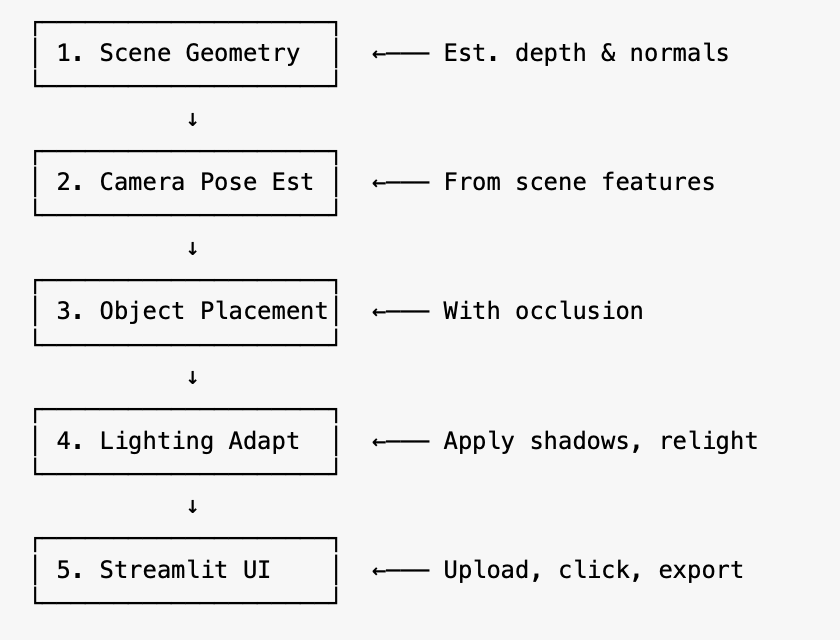

**Checkout the link for the pipeline architecture:  https://chatgpt.com/share/67fa8feb-32dc-800f-8075-851b0e35fd42**

# Scene image and Object


In [ ]:
!pip install --quiet gdown

In [ ]:
import gdown

# URL for the .glb file (3D object)
url_glb = 'https://drive.google.com/uc?id=1tGyOA98PIxVTP7scK4RfyfpSyzsU0Q-5'
output_glb = 'object.glb'

# URL for the .jpeg file (scene image)
url_jpeg = 'https://drive.google.com/uc?id=1G7ZxnwVP7aem7Tv-wGJaI_dASYTxfE6H'
output_jpeg = 'scene_image.jpeg'

# Download the files
gdown.download(url_glb, output_glb, quiet=False)
gdown.download(url_jpeg, output_jpeg, quiet=False)


Downloading...
From: https://drive.google.com/uc?id=1tGyOA98PIxVTP7scK4RfyfpSyzsU0Q-5
To: /content/object.glb
100%|██████████| 26.9M/26.9M [00:00<00:00, 29.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1G7ZxnwVP7aem7Tv-wGJaI_dASYTxfE6H
To: /content/scene_image.jpeg
100%|██████████| 144k/144k [00:00<00:00, 4.79MB/s]


'scene_image.jpeg'

# Scene Geometry │ ←——— Est. depth & normals (Omprakash Nain)

In [ ]:
!pip install --quiet timm

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/cli/base_command.py", line 179, in exc_logging_wrapper
    status = run_func(*args)
             ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/cli/req_command.py", line 67, in wrapper
    return func(self, options, args)
           ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/commands/install.py", line 377, in run
    requirement_set = resolver.resolve(
                      ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/resolution/resolvelib/resolver.py", line 95, in resolve
    result = self._result = resolver.resolve(
                            ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_vendor/resolvelib/resolvers.py", line 546, in resolve
    state = resolution.resolve(requirements, max_rounds=max_rounds)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

In [ ]:
import torch

# Choose model type: "DPT_Large", "DPT_Hybrid", or "MiDaS_small"
model_type = "DPT_Large"

# Load the pre-trained MiDaS model from PyTorch Hub and set up the device.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
midas = torch.hub.load("intel-isl/MiDaS", model_type)
midas.to(device)
midas.eval()

# Load the corresponding transforms based on the chosen model.
midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")
if model_type in ["DPT_Large", "DPT_Hybrid"]:
    transform = midas_transforms.dpt_transform
else:
    transform = midas_transforms.small_transform

print(f"Loaded MiDaS model '{model_type}' on {device}.")


/usr/local/lib/python3.11/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/intel-isl/MiDaS/zipball/master" to /root/.cache/torch/hub/master.zip
/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.l

Loaded MiDaS model 'DPT_Large' on cpu.


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


In [ ]:
import cv2
import numpy as np
from typing import Tuple

def estimate_scene_geometry(image: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    """
    Estimate the scene geometry from an input RGB image.
    The function computes:
      - A normalized depth map via the globally loaded MiDaS model.
      - A surface normal map computed via Sobel gradients on the depth map.

    Parameters:
        image (np.ndarray): Input image as a NumPy array in RGB format.

    Returns:
        depth_map (np.ndarray): Normalized depth map (values in [0,1]).
        normal_map (np.ndarray): Surface normal map (H x W x 3) with per-pixel unit vectors.
    """
    # Preprocess the image and run inference (using the working code snippet).
    input_batch = transform(image).to(device)
    with torch.no_grad():
        prediction = midas(input_batch)
        # Resize the output depth map to match the original image dimensions.
        prediction = torch.nn.functional.interpolate(
            prediction.unsqueeze(1),
            size=image.shape[:2],
            mode="bicubic",
            align_corners=False
        ).squeeze()
    depth_map = prediction.cpu().numpy()

    # Normalize the depth map to range [0, 1].
    depth_min, depth_max = depth_map.min(), depth_map.max()
    if depth_max - depth_min < 1e-6:
        depth_map_norm = np.zeros(depth_map.shape, dtype=np.float32)
    else:
        depth_map_norm = (depth_map - depth_min) / (depth_max - depth_min)

    # -----------------------------
    # Compute Surface Normals via Sobel Gradients
    # -----------------------------
    # Convert the normalized depth map to float32.
    depth_map_norm_scaled = depth_map_norm.astype(np.float32)

    # Compute gradients in the x and y directions.
    grad_x = cv2.Sobel(depth_map_norm_scaled, cv2.CV_64F, 1, 0, ksize=5)
    grad_y = cv2.Sobel(depth_map_norm_scaled, cv2.CV_64F, 0, 1, ksize=5)

    # Build the normal map per pixel: (-grad_x, -grad_y, 1).
    normal_map = np.dstack((-grad_x, -grad_y, np.ones_like(depth_map_norm_scaled)))

    # Normalize the normal vectors.
    norm = np.linalg.norm(normal_map, axis=2, keepdims=True)
    norm[norm == 0] = 1  # Avoid division by zero.
    normal_map = normal_map / norm

    return depth_map_norm, normal_map


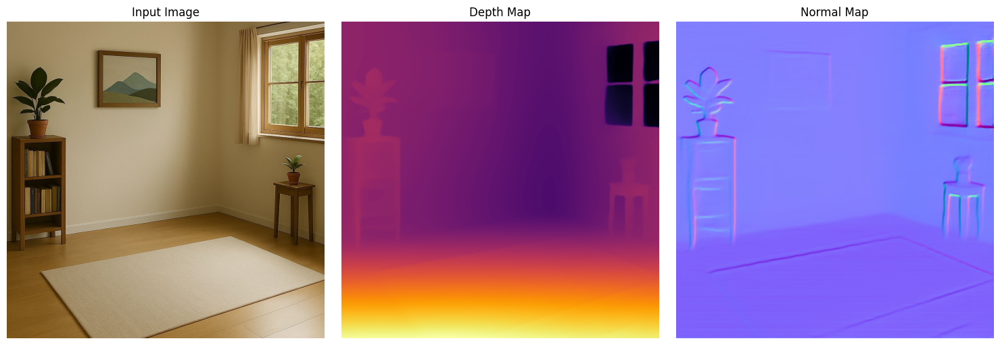

Depth map and normal map computed and saved successfully.


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Set the image path; upload your image to Colab (e.g., via the left sidebar File upload)
image_path = "/content/scene_image.jpeg"  # Replace with your image file name

# Load and convert the local image.
img = cv2.imread(image_path)
if img is None:
    raise FileNotFoundError("Input image not found. Please check the path.")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Run the geometry estimation function.
depth_map, normal_map = estimate_scene_geometry(img_rgb)

# Optionally, save the computed depth map and normal map as .npy files.
np.save("depth_map.npy", depth_map)
np.save("normal_map.npy", normal_map)

# Visualize the input image and the estimated depth map.
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img_rgb)
plt.title("Input Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(depth_map, cmap='inferno')
plt.title("Depth Map")
plt.axis('off')

# For visualizing the normal map, convert values from [-1,1] to [0,255].
normal_vis = ((normal_map + 1) / 2 * 255).astype(np.uint8)
plt.subplot(1, 3, 3)
plt.imshow(normal_vis)
plt.title("Normal Map")
plt.axis('off')

plt.tight_layout()
plt.show()

print("Depth map and normal map computed and saved successfully.")


# Camera Pose Est │ ←——— From scene features (Shahil Sharma)

In [ ]:
import cv2
import numpy as np

def detect_lines(image):
    """
    Convert image to grayscale, detect edges using Canny, then
    detect lines using probabilistic Hough Transform.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 50, 150, apertureSize=3)
    # Adjust parameters as needed.
    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=80, minLineLength=50, maxLineGap=10)
    return lines

def line_intersection(line1, line2):
    """
    Compute the intersection point of two lines.
    Each line is represented as [x1, y1, x2, y2].
    Returns the intersection point (x, y) or None if lines are parallel.
    """
    x1, y1, x2, y2 = line1
    x3, y3, x4, y4 = line2
    denom = (x1 - x2) * (y3 - y4) - (y1 - y2) * (x3 - x4)
    if denom == 0:
        return None
    Px = ((x1*y2 - y1*x2)*(x3 - x4) - (x1 - x2)*(x3*y4 - y3*x4)) / denom
    Py = ((x1*y2 - y1*x2)*(y3 - y4) - (y1 - y2)*(x3*y4 - y3*x4)) / denom
    return np.array([Px, Py])

def compute_intersections(lines):
    """
    Compute all intersections between detected lines.
    Returns a list of intersection points.
    """
    intersections = []
    if lines is None:
        return intersections

    for i in range(len(lines)):
        for j in range(i+1, len(lines)):
            l1 = lines[i][0]
            l2 = lines[j][0]
            pt = line_intersection(l1, l2)
            if pt is not None:
                intersections.append(pt)
    return intersections

def cluster_vanishing_points(intersections):
    """
    Cluster the set of intersection points to determine dominant vanishing points.
    Uses K-means clustering (assuming k=2 dominant directions).
    Returns an array of cluster centers (vanishing point candidates).
    """
    if len(intersections) == 0:
        return None

    intersections_np = np.array(intersections)
    # Define K-means criteria and perform clustering.
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    k = 2  # Assuming two dominant vanishing directions.
    compactness, labels, centers = cv2.kmeans(intersections_np.astype(np.float32), k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    return centers

def estimate_camera_pose(image, depth=None):
    """
    Estimate camera intrinsics and extrinsics based on vanishing points.
    In addition to the previous rotation estimation, if a depth map is provided,
    estimate a simple translation based on the median depth in a region assumed
    to correspond to the ground (e.g., the bottom 10% of the image).

    Input:
      image: Input scene image (BGR, as a NumPy array)
      depth: Optional depth map (2D numpy array) corresponding to the image.
             Should be in the same resolution as the image.

    Output:
      camera_matrix: 3x3 intrinsic matrix.
      pose_matrix: 4x4 extrinsic matrix (rotation & translation).
    """
    h, w = image.shape[:2]

    # Heuristic focal length estimation (could be replaced by calibration data).
    f = 1.2 * w
    cx, cy = w / 2, h / 2
    camera_matrix = np.array([[f, 0, cx],
                              [0, f, cy],
                              [0, 0, 1]])

    # Detect lines in the image.
    lines = detect_lines(image)
    # Compute intersections of these lines.
    intersections = compute_intersections(lines)
    # Cluster intersections to obtain vanishing point candidates.
    vanishing_points = cluster_vanishing_points(intersections)

    # Estimate a simple rotation matrix from vanishing points.
    if vanishing_points is not None and len(vanishing_points) >= 2:
        vp1 = vanishing_points[0]
        vp2 = vanishing_points[1]
        # Assume vp1 and vp2 correspond to independent scene directions.
        dir1 = np.array([vp1[0] - cx, vp1[1] - cy, f])
        dir2 = np.array([vp2[0] - cx, vp2[1] - cy, f])
        # Normalize these direction vectors.
        dir1_norm = dir1 / np.linalg.norm(dir1)
        dir2_norm = dir2 / np.linalg.norm(dir2)
        # Compute third orthogonal axis via cross product.
        z_axis = np.cross(dir1_norm, dir2_norm)
        z_axis = z_axis / np.linalg.norm(z_axis)
        # Recompute an orthogonal x-axis.
        x_axis = np.cross(dir2_norm, z_axis)
        x_axis = x_axis / np.linalg.norm(x_axis)
        # Use dir2_norm as y-axis for simplicity.
        R = np.stack([x_axis, dir2_norm, z_axis], axis=1)
    else:
        # Fallback: Identity rotation if vanishing points are insufficient.
        R = np.eye(3)

    # --- Integrating Depth Information for Translation ---
    # Use a representative region of the depth map to estimate scene scale.
    if depth is not None:
        # Use the bottom 10% of the image, assuming it is predominantly ground.
        bottom_region = depth[int(h * 0.9):, :]
        # Compute the median depth value in this region.
        median_depth = np.median(bottom_region)
        # Set translation along the Z-axis (assuming camera looks forward).
        # Optionally, more sophisticated region segmentation can improve this estimate.
        t = np.array([[0], [0], [median_depth]])
    else:
        # If no depth is available, use zero translation.
        t = np.zeros((3, 1))

    # Assemble the final 4x4 pose matrix.
    pose_matrix = np.eye(4)
    pose_matrix[:3, :3] = R
    pose_matrix[:3, 3] = t.flatten()

    return camera_matrix, pose_matrix

# For module testing and demonstration.
if __name__ == "__main__":
    # Update these paths as required.
    image_path = "/content/scene_image.jpeg"
    depth_path = "/content/depth_map.npy"  # Depth map saved as a NumPy file.

    image = cv2.imread(image_path)
    if image is None:
        print("Error: Could not load image from", image_path)
    else:
        try:
            # Load the depth map if available.
            depth = np.load(depth_path)
        except Exception as e:
            print("Warning: Could not load depth map. Reason:", e)
            depth = None

        camera_matrix, pose_matrix = estimate_camera_pose(image, depth)
        np.save("pose_matrix.npy", pose_matrix)
        print("Pose matrix saved to 'pose_matrix.npy'")

        print("Estimated Camera Intrinsic Matrix:\n", camera_matrix)
        print("Estimated Camera Pose Matrix:\n", pose_matrix)

Pose matrix saved to 'pose_matrix.npy'
Estimated Camera Intrinsic Matrix:
 [[1.2288e+03 0.0000e+00 5.1200e+02]
 [0.0000e+00 1.2288e+03 5.1200e+02]
 [0.0000e+00 0.0000e+00 1.0000e+00]]
Estimated Camera Pose Matrix:
 [[-0.96990185  0.20677323  0.1285894   0.        ]
 [ 0.18641092  0.29077641  0.9384562   0.        ]
 [ 0.15665686  0.93418088 -0.32056937  0.89077032]
 [ 0.          0.          0.          1.        ]]


In [ ]:
import cv2
import numpy as np

def draw_axes(image, camera_matrix, pose_matrix, axis_length=0.2):
    """
    Draw 3D camera coordinate axes on a 2D image.
    - X axis in RED
    - Y axis in GREEN
    - Z axis in BLUE
    """
    img = image.copy()

    # 3D points: origin and axis tips in camera coordinates
    axis_3d = np.array([
        [0, 0, 0],               # Origin
        [axis_length, 0, 0],     # X-axis
        [0, axis_length, 0],     # Y-axis
        [0, 0, axis_length]      # Z-axis
    ], dtype=np.float32)

    # Extract R and t from pose_matrix
    R = pose_matrix[:3, :3]
    t = pose_matrix[:3, 3].reshape((3, 1))

    # Use cv2.projectPoints to get 2D points
    axis_2d, _ = cv2.projectPoints(
        axis_3d,
        cv2.Rodrigues(R)[0],  # Convert rotation to Rodrigues
        t,
        camera_matrix,
        distCoeffs=None
    )

    origin = tuple(axis_2d[0].ravel().astype(int))
    x_axis = tuple(axis_2d[1].ravel().astype(int))
    y_axis = tuple(axis_2d[2].ravel().astype(int))
    z_axis = tuple(axis_2d[3].ravel().astype(int))

    # Draw axes
    cv2.line(img, origin, x_axis, (0, 0, 255), 3)  # X - Red
    cv2.line(img, origin, y_axis, (0, 255, 0), 3)  # Y - Green
    cv2.line(img, origin, z_axis, (255, 0, 0), 3)  # Z - Blue

    # Optionally label axes
    cv2.putText(img, 'X', x_axis, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
    cv2.putText(img, 'Y', y_axis, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    cv2.putText(img, 'Z', z_axis, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    return img

In [ ]:
from google.colab.patches import cv2_imshow

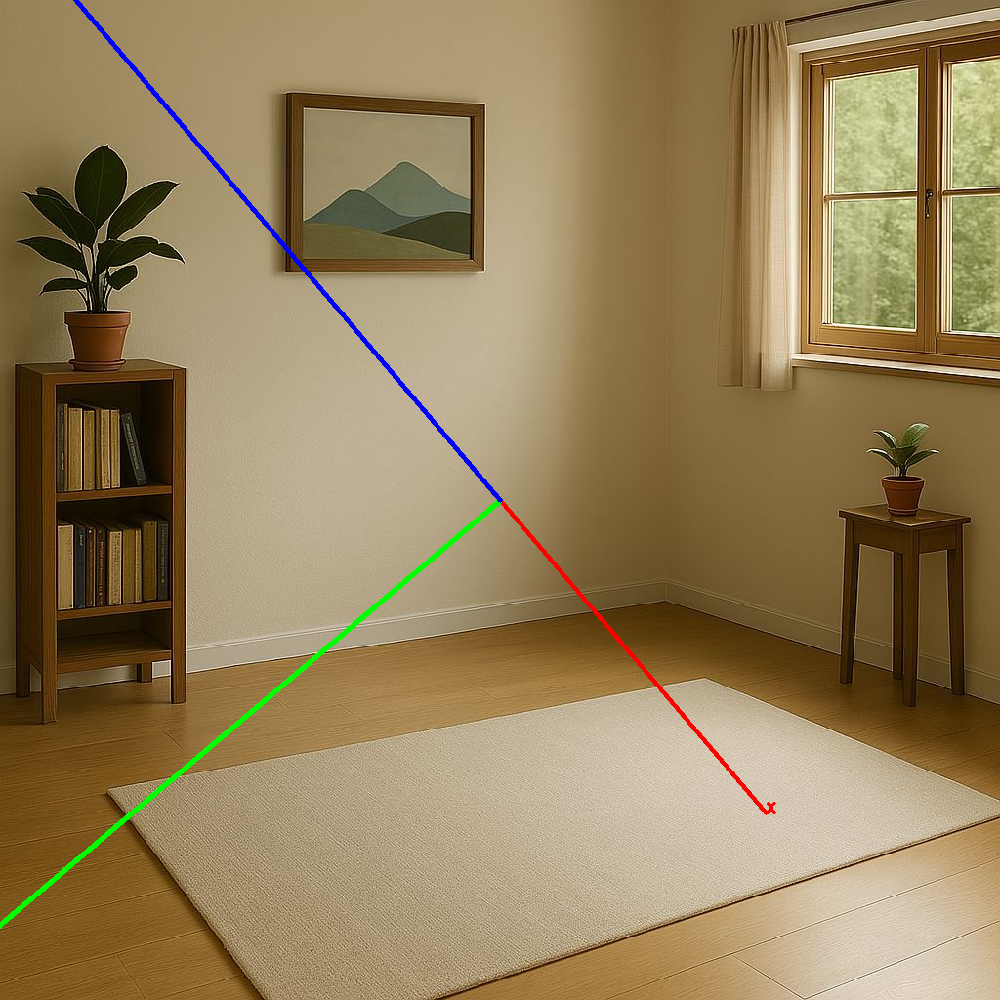

In [ ]:
# Load image and depth
image = cv2.imread("/content/scene_image.jpeg")
depth = np.load("depth_map.npy")

# Estimate pose
camera_matrix, pose_matrix = estimate_camera_pose(image)

# Draw the axes
img_with_axes = draw_axes(image, camera_matrix, pose_matrix)

# Show or save the result
from google.colab.patches import cv2_imshow
cv2_imshow(img_with_axes)

# Object Placement│ ←——— With occlusion (Abhishek & Vignesh)

In [ ]:
!pip install --quiet opencv-python numpy trimesh pyrender


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 21.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 709.3/709.3 kB 34.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 61.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 962.1/962.1 kB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 56.3 MB/s eta 0:00:00


In [ ]:
import os
import cv2
import numpy as np
import torch
import trimesh
import pyrender
import matplotlib.pyplot as plt
from typing import Tuple, Optional
from google.colab.patches import cv2_imshow

In [ ]:
# -----------------------------------------------------------------------------
# ------------------------- Scene Geometry --------------------------
# -----------------------------------------------------------------------------

def estimate_scene_geometry(image: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    model_type = "DPT_Large"
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    midas = torch.hub.load("intel-isl/MiDaS", model_type)
    midas.to(device)
    midas.eval()

    midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")
    if model_type in ["DPT_Large", "DPT_Hybrid"]:
        transform = midas_transforms.dpt_transform
    else:
        transform = midas_transforms.small_transform
    print(f"Loaded MiDaS model '{model_type}' on {device}.")

    input_batch = transform(image).to(device)
    with torch.no_grad():
        prediction = midas(input_batch)
        prediction = torch.nn.functional.interpolate(
            prediction.unsqueeze(1),
            size=image.shape[:2],
            mode="bicubic",
            align_corners=False
        ).squeeze()

    depth_map = prediction.cpu().numpy()

    depth_min, depth_max = depth_map.min(), depth_map.max()
    if depth_max - depth_min < 1e-6:
        depth_map_norm = np.zeros(depth_map.shape, dtype=np.float32)
    else:
        depth_map_norm = (depth_map - depth_min) / (depth_max - depth_min)


    depth_map_norm_scaled = depth_map_norm.astype(np.float32)
    grad_x = cv2.Sobel(depth_map_norm_scaled, cv2.CV_64F, 1, 0, ksize=5)
    grad_y = cv2.Sobel(depth_map_norm_scaled, cv2.CV_64F, 0, 1, ksize=5)
    normal_map = np.dstack(
        (-grad_x, -grad_y, np.ones_like(depth_map_norm_scaled))
    )
    norm = np.linalg.norm(normal_map, axis=2, keepdims=True)
    norm[norm == 0] = 1
    normal_map = normal_map / norm

    return depth_map_norm, normal_map


In [ ]:
# -----------------------------------------------------------------------------
# --------------------- Camera Pose Estimation ----------------------
# -----------------------------------------------------------------------------

def detect_lines(image: np.ndarray):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 50, 150, apertureSize=3)
    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=80,
                            minLineLength=50, maxLineGap=10)
    return lines

In [ ]:
def line_intersection(line1, line2):
    x1, y1, x2, y2 = line1
    x3, y3, x4, y4 = line2
    denom = (x1 - x2)*(y3 - y4) - (y1 - y2)*(x3 - x4)
    if denom == 0:
        return None
    Px = ((x1*y2 - y1*x2)*(x3 - x4) - (x1 - x2)*(x3*y4 - y3*x4)) / denom
    Py = ((x1*y2 - y1*x2)*(y3 - y4) - (y1 - y2)*(x3*y4 - y3*x4)) / denom
    return np.array([Px, Py])

In [ ]:
def compute_intersections(lines):
    intersections = []
    if lines is None:
        return intersections
    for i in range(len(lines)):
        for j in range(i+1, len(lines)):
            pt = line_intersection(lines[i][0], lines[j][0])
            if pt is not None:
                intersections.append(pt)
    return intersections

In [ ]:
def cluster_vanishing_points(intersections):
    if len(intersections) == 0:
        return None
    pts = np.array(intersections)
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    k = 2
    _, _, centers = cv2.kmeans(
        pts.astype(np.float32), k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS
    )
    return centers

In [ ]:
def estimate_camera_pose(image: np.ndarray,
                         depth: Optional[np.ndarray] = None,
                         camera_zoom_factor: float = 1.0
                         ) -> Tuple[np.ndarray, np.ndarray]:

    h, w = image.shape[:2]
    # Original f
    # f = 1.2 * w
    f = (1.2 * w) / camera_zoom_factor

    cx, cy = w / 2, h / 2
    camera_matrix = np.array([[f, 0, cx],
                              [0, f, cy],
                              [0, 0, 1]])

    lines = detect_lines(image)
    intersections = compute_intersections(lines)
    vps = cluster_vanishing_points(intersections)

    if vps is not None and len(vps) >= 2:
        vp1, vp2 = vps[0], vps[1]
        dir1 = np.array([vp1[0] - cx, vp1[1] - cy, f])
        dir2 = np.array([vp2[0] - cx, vp2[1] - cy, f])
        dir1_norm = dir1 / np.linalg.norm(dir1)
        dir2_norm = dir2 / np.linalg.norm(dir2)
        z_axis = np.cross(dir1_norm, dir2_norm)
        z_axis = z_axis / np.linalg.norm(z_axis)
        x_axis = np.cross(dir2_norm, z_axis)
        x_axis = x_axis / np.linalg.norm(x_axis)
        R = np.stack([x_axis, dir2_norm, z_axis], axis=1)
    else:
        R = np.eye(3)

    if depth is not None:
        bottom_region = depth[int(h*0.9):, :]
        median_depth = np.median(bottom_region)
        t = np.array([[0], [0], [median_depth]])
    else:
        t = np.zeros((3, 1))

    pose_matrix = np.eye(4)
    pose_matrix[:3, :3] = R
    pose_matrix[:3, 3] = t.flatten()

    return camera_matrix, pose_matrix

In [ ]:
# -----------------------------------------------------------------------------
# --------------------- Object Placement Module ---------------------
# -----------------------------------------------------------------------------

DEBUG_FORCE_OBJECT = False
DISABLE_OCCLUSION = False
APPLY_ROTATION_CORRECTION = True


def compose_rotation(angle_x: float, angle_y: float, angle_z: float) -> np.ndarray:

    rx = np.deg2rad(angle_x)
    ry = np.deg2rad(angle_y)
    rz = np.deg2rad(angle_z)

    Rx = np.array([
        [1,      0,       0,      0],
        [0, np.cos(rx), -np.sin(rx), 0],
        [0, np.sin(rx),  np.cos(rx), 0],
        [0,      0,       0,      1]
    ], dtype=np.float32)
    Ry = np.array([
        [ np.cos(ry), 0, np.sin(ry), 0],
        [          0, 1,         0, 0],
        [-np.sin(ry), 0, np.cos(ry), 0],
        [          0, 0,         0, 1]
    ], dtype=np.float32)
    Rz = np.array([
        [np.cos(rz), -np.sin(rz), 0, 0],
        [np.sin(rz),  np.cos(rz), 0, 0],
        [         0,           0, 1, 0],
        [         0,           0, 0, 1]
    ], dtype=np.float32)

    R_combined = Rz @ Ry @ Rx
    return R_combined


In [ ]:
def place_object(scene: np.ndarray,
                 object_model_path: str,
                 camera_params: Tuple[np.ndarray, np.ndarray],
                 scene_depth: Optional[np.ndarray] = None,
                 placement_point: Optional[Tuple[int, int]] = None,
                 object_scale: float = 1.0,
                 object_offset: float = 0.0,
                 angle_x: float = 0.0,
                 angle_y: float = 0.0,
                 angle_z: float = 0.0) -> Tuple[np.ndarray, Optional[np.ndarray]]:

    camera_matrix, pose_matrix = camera_params
    h, w, _ = scene.shape

    if placement_point is None:
        placement_point = (w // 2, h // 2)
    click_x, click_y = placement_point
    print(f"Placement point (image coordinates): {placement_point}")

    try:
        mesh = trimesh.load(object_model_path)
        if isinstance(mesh, trimesh.Scene):
            if len(mesh.geometry) == 0:
                raise RuntimeError("The scene contains no geometry.")
            mesh = trimesh.util.concatenate(tuple(mesh.geometry.values()))
        print(f"Loaded mesh with {len(mesh.vertices)} vertices.")
        mesh.apply_scale(object_scale)
        print(f"Applied object scale: {object_scale}")
    except Exception as e:
        raise RuntimeError(f"Failed to load object model: {e}")

    render_scene = pyrender.Scene(bg_color=[0, 0, 0, 0], ambient_light=[0.1, 0.1, 0.1])
    light = pyrender.DirectionalLight(color=np.ones(3), intensity=10.0)
    render_scene.add(light, pose=np.eye(4))
    render_mesh = pyrender.Mesh.from_trimesh(mesh, smooth=False)

    if DISABLE_OCCLUSION or scene_depth is None:
        depth_val = 1.0
    else:
        depth_val = scene_depth[min(click_y, scene_depth.shape[0] - 1),
                                min(click_x, scene_depth.shape[1] - 1)]
        if depth_val <= 0:
            print("Depth value non-positive. Using fallback 1.5.")
            depth_val = 1.5
    print(f"Depth at placement point: {depth_val}")

    fx, fy = camera_matrix[0, 0], camera_matrix[1, 1]
    cx, cy = camera_matrix[0, 2], camera_matrix[1, 2]

    new_depth = depth_val + object_offset
    X = (click_x - cx) * new_depth / fx
    Y = (click_y - cy) * new_depth / fy
    Z = new_depth
    placement_3d = np.array([X, Y, Z, 1.0]).reshape((4, 1))
    print(f"Camera coordinate placement (homogeneous): {placement_3d.ravel()}")

    world_placement = np.linalg.inv(pose_matrix) @ placement_3d
    world_placement = world_placement.flatten()[:3]
    print(f"World coordinate placement: {world_placement}")

    translation = np.eye(4)
    translation[:3, 3] = world_placement

    R_custom = compose_rotation(angle_x, angle_y, angle_z)

    if DEBUG_FORCE_OBJECT:
        forced_translation = np.eye(4)
        forced_translation[2, 3] = -2.0
        print("DEBUG: Forcing object transform at Z = -2.0.")
        object_transform = forced_translation @ R_custom
    else:
        object_transform = translation @ R_custom

    print("Final object transform matrix:")
    print(object_transform)

    obj_node = pyrender.Node(mesh=render_mesh, matrix=object_transform)
    render_scene.add_node(obj_node)

    camera_pose = np.linalg.inv(pose_matrix)
    camera_intrinsics = pyrender.IntrinsicsCamera(
        fx=fx, fy=fy, cx=cx, cy=cy, znear=0.01, zfar=10000.0
    )
    render_scene.add(camera_intrinsics, pose=camera_pose)

    renderer = pyrender.OffscreenRenderer(viewport_width=w, viewport_height=h)
    render_color, render_depth = renderer.render(render_scene)
    renderer.delete()
    print("Rendering complete.")
    print("Displaying raw render output:")
    cv2_imshow(render_color)

    occlusion_mask = None
    if not DISABLE_OCCLUSION and scene_depth is not None:
        if scene_depth.shape != render_depth.shape:
            scene_depth_resized = cv2.resize(scene_depth, (w, h),
                                             interpolation=cv2.INTER_LINEAR)
        else:
            scene_depth_resized = scene_depth
        scale_factor = 10.0
        scene_depth_metric = scene_depth_resized * scale_factor

        print(f"Scene depth (resized) min/max: {scene_depth_resized.min():.3f} / {scene_depth_resized.max():.3f}")
        print(f"Scene depth (metric) min/max: {scene_depth_metric.min():.3f} / {scene_depth_metric.max():.3f}")
        print(f"Rendered depth min/max: {render_depth.min():.3f} / {render_depth.max():.3f}")

        occlusion_mask = (render_depth > 0) & (render_depth < scene_depth_metric + 1e-6)
        occlusion_mask = occlusion_mask.astype(np.uint8)
        occlusion_mask_blur = cv2.GaussianBlur(occlusion_mask.astype(np.float32), (7, 7), 0)
        occlusion_mask = (occlusion_mask_blur > 0.5).astype(np.uint8)

        print("Occlusion mask computed. Unique values:", np.unique(occlusion_mask))
        cv2_imshow((occlusion_mask * 255).astype(np.uint8))
    else:
        print("Occlusion handling disabled.")

    scene_float = scene.astype(np.float32) / 255.0
    object_float = render_color.astype(np.float32) / 255.0

    if occlusion_mask is not None:
        mask_3ch = np.repeat(occlusion_mask[:, :, np.newaxis], 3, axis=2)
        result_img = object_float * mask_3ch + scene_float * (1 - mask_3ch)
    else:
        non_zero = (np.sum(object_float, axis=2) > 0).astype(np.float32)[:, :, np.newaxis]
        result_img = object_float * non_zero + scene_float * (1 - non_zero)

    result_img = (result_img * 255).astype(np.uint8)
    cv2.imwrite("scene_with_object.png", cv2.cvtColor(result_img, cv2.COLOR_RGB2BGR))
    if occlusion_mask is not None:
        occlusion_mask_vis = (occlusion_mask * 255).astype(np.uint8)
        cv2.imwrite("occlusion_mask.png", occlusion_mask_vis)

    return result_img, occlusion_mask

In [ ]:
# Install necessary packages
!apt-get install --quiet -y xvfb xorg-dev python-opengl
!pip install --quiet pyvirtualdisplay

# Start a virtual display
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1024, 768))
display.start()


Reading package lists...
Building dependency tree...
Reading state information...
E: Unable to locate package python-opengl


Computing scene geometry using MiDaS...


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master
Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


Loaded MiDaS model 'DPT_Large' on cpu.
Depth map shape: (1024, 1024)
Estimating camera pose with camera_zoom_factor = 5
Camera Intrinsics:
 [[245.76   0.   512.  ]
 [  0.   245.76 512.  ]
 [  0.     0.     1.  ]]
Camera Pose:
 [[ 5.58936737e-01 -7.62312277e-01 -3.26296975e-01  0.00000000e+00]
 [ 6.58264030e-01  6.47209381e-01 -3.84458690e-01  0.00000000e+00]
 [ 5.04260043e-01  9.85241509e-05  8.63551851e-01  8.90770316e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]

Rendering angle 'tilted_right' (X: 0, Y: 0, Z: 45)
Placement point (image coordinates): (512, 819)
Loaded mesh with 85969 vertices.
Applied object scale: 0.1
Depth at placement point: 0.6094368696212769
Camera coordinate placement (homogeneous): [-0.         -0.1131302  -0.09056312  1.        ]
World coordinate placement: [-0.56931678 -0.07331561 -0.80393842]
Final object transform matrix:
[[ 0.70710677 -0.70710677  0.         -0.56931678]
 [ 0.70710677  0.70710677  0.         -0.07331561]
 [ 0.   

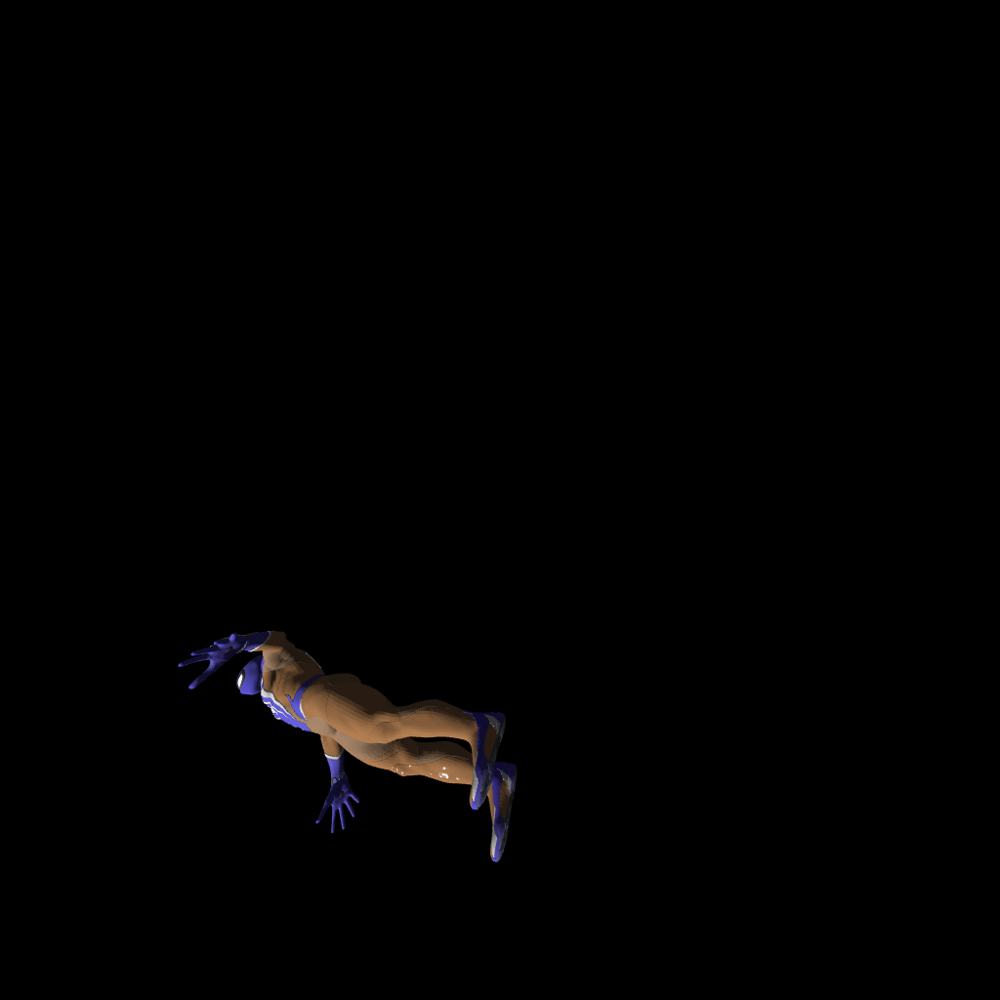

Scene depth (resized) min/max: 0.000 / 1.000
Scene depth (metric) min/max: 0.000 / 10.000
Rendered depth min/max: 0.000 / 0.160
Occlusion mask computed. Unique values: [0 1]


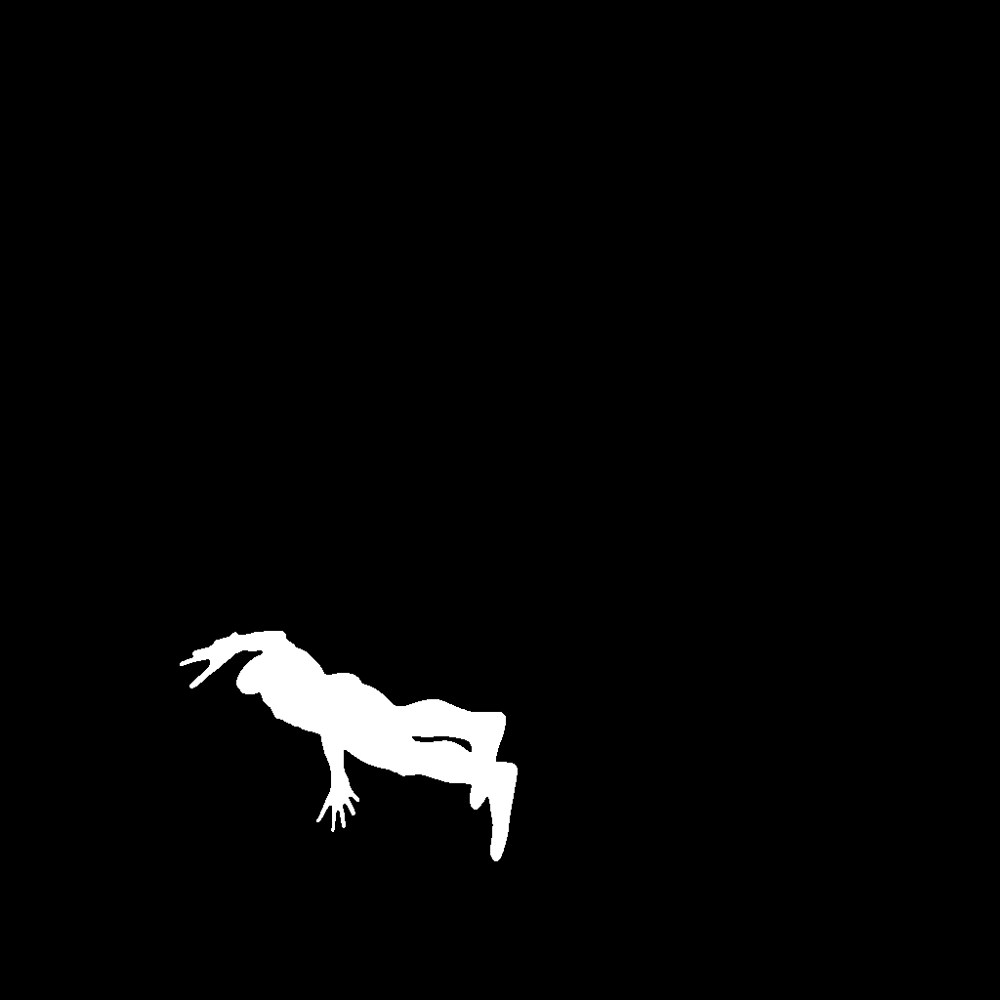

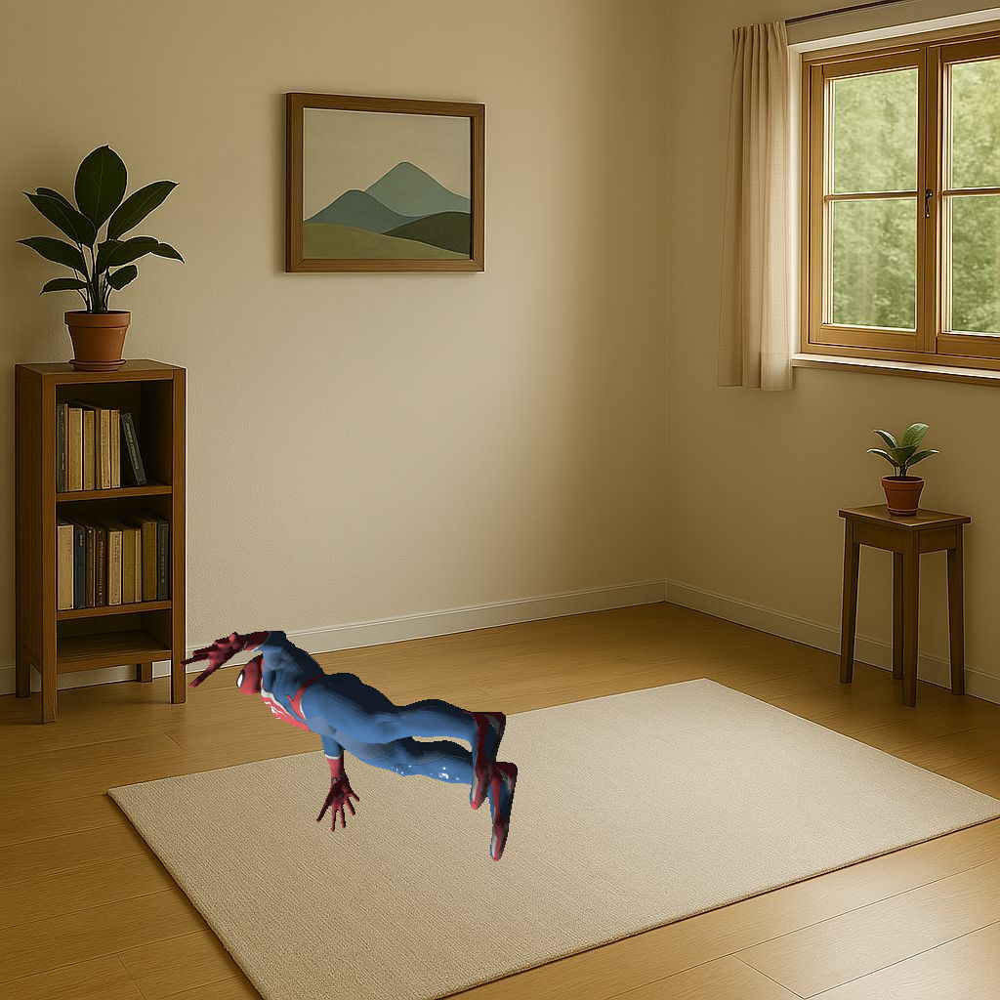

In [ ]:
def main():
    scene_path = "/content/scene_image.jpeg"
    object_model_path = "/content/object.glb"

    scene = cv2.imread(scene_path)
    if scene is None:
        raise FileNotFoundError(f"Scene image not found: {scene_path}")
    scene_rgb = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)

    print("Computing scene geometry using MiDaS...")
    depth_map, normal_map = estimate_scene_geometry(scene_rgb)
    print("Depth map shape:", depth_map.shape)

    camera_zoom_factor = 5
    print("Estimating camera pose with camera_zoom_factor =", camera_zoom_factor)
    camera_matrix, pose_matrix = estimate_camera_pose(scene, depth_map, camera_zoom_factor=camera_zoom_factor)
    print("Camera Intrinsics:\n", camera_matrix)
    print("Camera Pose:\n", pose_matrix)

    camera_params = (camera_matrix, pose_matrix)
    h, w, _ = scene_rgb.shape

    placement_point = (w // 2, int(0.8 * h))
    object_scale = 0.1
    object_offset = -0.7

    # Angle dictionary (only angles vary)
    angle_variations = {
        # "upright_front": (90, 0, 0)
        # "upright_side": (0, 45, 0),
        # "upright_back": (0, 180, 0),
        # "lying_down_faceup": (-90, 0, 0),
        # "lying_down_facedown": (90, 0, 0),
        # "tilted_left": (0, 0, -45)
        "tilted_right": (0, 0, 45)
    }

    for name, (angle_x, angle_y, angle_z) in angle_variations.items():
        print(f"\nRendering angle '{name}' (X: {angle_x}, Y: {angle_y}, Z: {angle_z})")
        result_img, occ_mask = place_object(
            scene_rgb,
            object_model_path,
            camera_params,
            scene_depth=depth_map,
            placement_point=placement_point,
            object_scale=object_scale,
            object_offset=object_offset,
            angle_x=angle_x,
            angle_y=angle_y,
            angle_z=angle_z
        )

        display_img = cv2.cvtColor(result_img, cv2.COLOR_RGB2BGR)
        cv2_imshow(display_img)
        cv2.imwrite(f"/content/spiderman_{name}.png", display_img)

if __name__ == "__main__":
    main()

#  Lighting Adapt │ ←——— Apply shadows, relight (Shivanshu)

##Gray-World Assumption and Soft-Shadows

✅ Final image saved to: final_output.jpg


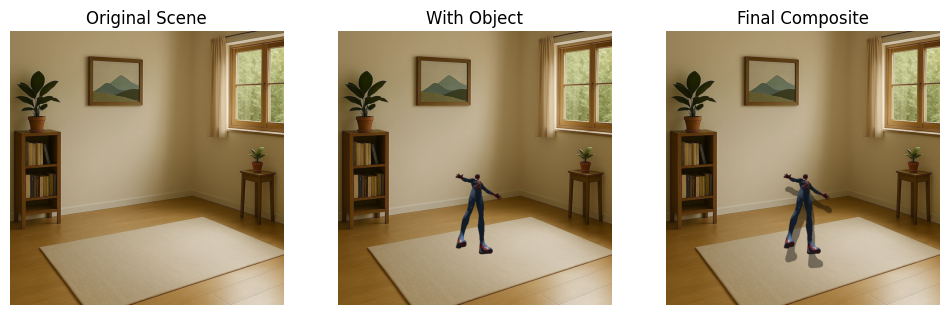

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from scipy.ndimage import gaussian_filter

# --- STEP 1: Load images ---
def load_images(scene_path, object_scene_path):
    scene = cv2.imread(scene_path)
    object_scene = cv2.imread(object_scene_path)
    if scene is None or object_scene is None:
        raise FileNotFoundError("Check image paths.")
    scene = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)
    object_scene = cv2.cvtColor(object_scene, cv2.COLOR_BGR2RGB)
    return scene, object_scene

# --- STEP 2: Extract object mask ---
def extract_object_mask(scene, object_scene):
    diff = cv2.absdiff(scene, object_scene)
    gray_diff = cv2.cvtColor(diff, cv2.COLOR_RGB2GRAY)
    _, mask = cv2.threshold(gray_diff, 30, 255, cv2.THRESH_BINARY)
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    return mask

# --- STEP 3: Estimate shadow direction ---
def estimate_shadow_direction(scene):
    gray = cv2.cvtColor(scene, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, 50, 150)
    lines = cv2.HoughLines(edges, 1, np.pi / 180, threshold=100)
    if lines is None:
        return (20, 20)  # fallback direction

    angles = []
    for line in lines:
        rho, theta = line[0]
        angle = np.degrees(theta)
        if 20 < angle < 160:
            angles.append(angle)
    if not angles:
        return (20, 20)
    dominant_angle = np.median(angles)
    rad = np.radians(dominant_angle)
    dx = int(50 * np.cos(rad))
    dy = int(50 * np.sin(rad))
    return dx, dy

# --- STEP 4: Project a soft shadow ---
def project_shadow(object_mask, direction, blur=5):
    dx, dy = direction
    h, w = object_mask.shape
    shadow_mask = np.roll(object_mask, shift=(dy, dx), axis=(0, 1))
    shadow_mask = np.clip(shadow_mask, 0, 255)
    shadow = gaussian_filter(shadow_mask.astype(float), sigma=blur)
    shadow = (shadow / shadow.max() * 120).astype(np.uint8)
    return shadow

# --- STEP 5: Blend object + shadow into scene ---
def blend_object_with_shadow(scene, object_scene, object_mask, shadow_mask):
    shadow_colored = cv2.merge([shadow_mask] * 3)
    darkened = (scene * 0.6).astype(np.uint8)
    shadowed_scene = np.where(shadow_colored > 30, darkened, scene)

    object_mask_3 = cv2.merge([object_mask] * 3)
    final = np.where(object_mask_3 > 0, object_scene, shadowed_scene)
    return final

# --- STEP 6: Run full pipeline ---
def apply_realistic_compositing(scene_path, object_scene_path, output_path='final_output.jpg'):
    scene, object_scene = load_images(scene_path, object_scene_path)
    object_mask = extract_object_mask(scene, object_scene)
    shadow_dir = estimate_shadow_direction(scene)
    shadow_mask = project_shadow(object_mask, shadow_dir)
    final_img = blend_object_with_shadow(scene, object_scene, object_mask, shadow_mask)
    final_img_bgr = cv2.cvtColor(final_img, cv2.COLOR_RGB2BGR)
    cv2.imwrite(output_path, final_img_bgr)
    print(f"✅ Final image saved to: {output_path}")

    # Display the result
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.title("Original Scene")
    plt.imshow(scene)
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("With Object")
    plt.imshow(object_scene)
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Final Composite")
    plt.imshow(final_img)
    plt.axis("off")
    plt.show()

# --- Example usage ---
# Replace these with your actual image paths in Colab
scene_path = "scene.jpg"
object_scene_path = "scene_with_object.png"
apply_realistic_compositing(scene_path, object_scene_path)


In [ ]:
import cv2
import numpy as np

def extract_object_and_mask(scene, scene_with_object, threshold=25):
    """
    Estimate object mask and object image using image subtraction.
    """
    # Compute absolute difference to localize the object
    diff = cv2.absdiff(scene, scene_with_object)
    gray_diff = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)

    # Threshold to create binary mask
    _, mask = cv2.threshold(gray_diff, threshold, 255, cv2.THRESH_BINARY)
    mask = cv2.medianBlur(mask, 5)  # Smooth noise

    # Convert single channel mask to 3 channels
    mask_3ch = cv2.merge([mask] * 3)

    # Extract the object by masking the scene_with_object
    object_rgb = cv2.bitwise_and(scene_with_object, mask_3ch)

    return object_rgb, mask

def gray_world_lighting_correction(scene, object_img, mask, blend_ratio=0.5):
    """
    Adjust object lighting using Gray-World Assumption and blend with original to avoid overcorrection.
    """
    scene_means = cv2.mean(scene)[:3]
    mask_float = mask / 255.0
    obj = object_img.astype(np.float32)

    object_means = [
        np.sum(obj[:, :, i] * mask_float) / (np.sum(mask_float) + 1e-6)
        for i in range(3)
    ]

    # Compute ratios and limit extreme values
    ratios = [min(max(scene_means[i] / (object_means[i] + 1e-6), 0.8), 1.2) for i in range(3)]

    # Apply ratios and blend with original
    adjusted_obj = obj.copy()
    for i in range(3):
        channel_corrected = np.clip(obj[:, :, i] * ratios[i], 0, 255)
        adjusted_obj[:, :, i] = blend_ratio * channel_corrected + (1 - blend_ratio) * obj[:, :, i]

    return adjusted_obj.astype(np.uint8)


def create_soft_shadow(mask, offset=(0, 0), intensity=50):
    """
    Create a soft shadow from a binary mask.
    """
    shadow = np.zeros_like(mask)
    M = np.float32([[1, 0, offset[0]], [0, 1, offset[1]]])
    shifted_mask = cv2.warpAffine(mask, M, (mask.shape[1], mask.shape[0]))
    blurred = cv2.GaussianBlur(shifted_mask, (31, 31), 0)

    # Create a 3-channel black shadow with soft alpha
    shadow_rgb = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    for i in range(3):
        shadow_rgb[:, :, i] = (blurred / 255.0 * intensity).astype(np.uint8)

    return blurred, shadow_rgb

def blend_object_and_shadow(scene, adjusted_object, mask, shadow_mask, shadow_rgb):
    """
    Composite the adjusted object and its shadow onto the scene.
    """
    output = scene.copy()

    # Blend shadow
    shadow_indices = shadow_mask > 0
    output[shadow_indices] = cv2.addWeighted(
        output[shadow_indices], 1.0,
        shadow_rgb[shadow_indices], 0.5, 0
    )

    # Soften object mask using Gaussian blur
    mask_soft = cv2.GaussianBlur(mask, (15, 15), 0)
    mask_float = mask_soft.astype(np.float32) / 255.0
    inv_mask = 1 - mask_float

    for c in range(3):
        output[:, :, c] = (adjusted_object[:, :, c] * mask_float +
                           output[:, :, c] * inv_mask).astype(np.uint8)

    return output

def add_contact_shadow(scene, mask, intensity=50):
    feet_shadow = cv2.erode(mask, np.ones((7, 7), np.uint8))
    blurred = cv2.GaussianBlur(feet_shadow, (21, 21), 5)
    contact_shadow = np.zeros_like(scene)
    for c in range(3):
        contact_shadow[:, :, c] = (blurred / 255.0 * intensity).astype(np.uint8)

    return cv2.addWeighted(scene, 1.0, contact_shadow, 0.5, 0)


def adjust_lighting(scene: np.ndarray, scene_with_object: np.ndarray) -> np.ndarray:
    object_rgb, mask = extract_object_and_mask(scene, scene_with_object)
    adjusted_object = gray_world_lighting_correction(scene, object_rgb, mask)
    shadow_mask, shadow_rgb = create_soft_shadow(mask)
    final = blend_object_and_shadow(scene, adjusted_object, mask, shadow_mask, shadow_rgb)
    final = add_contact_shadow(final, mask)
    return final



Scene with Object Image



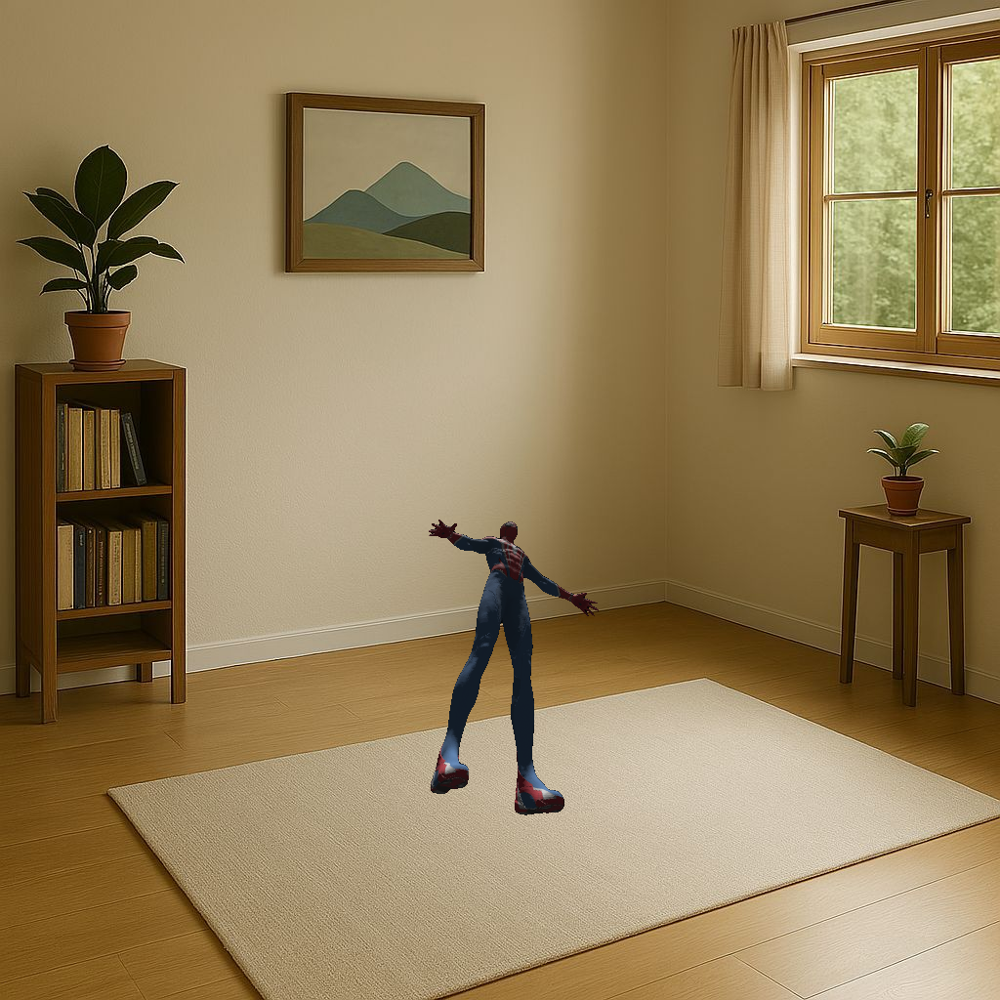

Final Result



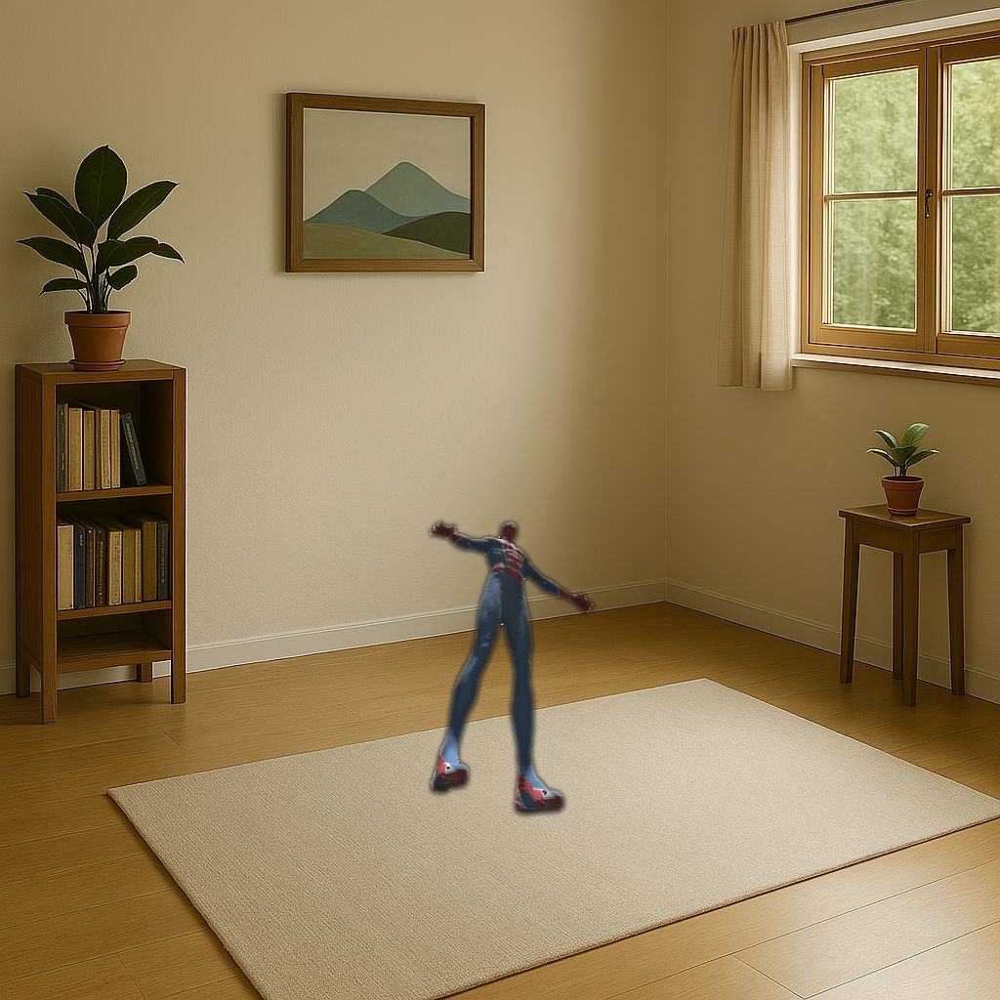

Result saved to Gray_World.png


In [ ]:

if __name__ == "__main__":
    # Load images
    scene = cv2.imread("/content/scene.jpg")
    object_img = cv2.imread("/content/scene_with_object.png", cv2.IMREAD_UNCHANGED)  # With alpha
    print("Scene with Object Image\n")
    cv2_imshow(object_img)

    if object_img is None or scene is None:
        raise FileNotFoundError("Check image paths. One or both images not found.")


    result = adjust_lighting(scene, object_img)
    print("Final Result\n")
    cv2_imshow(result)

    # Save result
    cv2.imwrite("Gray_World.png", result)
    print("Result saved to Gray_World.png")


##Retinex-based Lighting and Shadow Adaptation

In [ ]:
# import cv2
# import numpy as np

# def multi_scale_retinex(image, scales=[30, 150, 500]):
#     """
#     Apply Multi-Scale Retinex (MSR) to estimate reflectance.
#     """
#     image = image.astype(np.float32) + 1.0  # Avoid log(0)
#     log_image = np.log(image)

#     msr = np.zeros_like(image)
#     for scale in scales:
#         blur = cv2.GaussianBlur(image, (0, 0), sigmaX=scale, sigmaY=scale)
#         log_blur = np.log(blur + 1.0)
#         msr += log_image - log_blur

#     msr /= len(scales)
#     msr = np.uint8(np.clip(msr * 32, 0, 255))  # Expand dynamic range
#     return msr

# def extract_object_mask(scene_with_obj, scene, threshold=30):
#     """
#     Extracts the mask of the object by subtracting the scene from scene_with_obj.
#     """
#     diff = cv2.absdiff(scene_with_obj, scene)
#     gray_diff = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)
#     _, mask = cv2.threshold(gray_diff, threshold, 255, cv2.THRESH_BINARY)

#     # Refine mask
#     kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
#     mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
#     return mask

# def apply_lighting_transfer(scene, scene_with_object):
#     """
#     Apply scene's lighting on object pasted into scene_with_object.
#     """
#     illum_scene = multi_scale_retinex(scene)
#     mask = extract_object_mask(scene_with_object, scene)
#     mask_3ch = cv2.merge([mask] * 3)

#     result = scene_with_object.copy()
#     result = np.where(mask_3ch == 255, illum_scene, result)
#     return result

import cv2
import numpy as np

# ========================
# Retinex-Based Illumination
# ========================
def multi_scale_retinex_normalized(image, scales=[15, 80, 250], gain=1.5, offset=15):
    """
    Applies MSR with tuned normalization to preserve object realism.
    """
    image = image.astype(np.float32) + 1.0
    log_image = np.log(image)

    msr = np.zeros_like(image)
    for scale in scales:
        blur = cv2.GaussianBlur(image, (0, 0), sigmaX=scale, sigmaY=scale)
        log_blur = np.log(blur + 1.0)
        msr += log_image - log_blur

    msr /= len(scales)

    # Normalize each channel with gain and offset
    for c in range(3):
        channel = msr[:, :, c]
        channel = gain * (channel - np.min(channel)) / (np.max(channel) - np.min(channel) + 1e-6) * 255
        msr[:, :, c] = channel + offset

    msr = np.uint8(np.clip(msr, 0, 255))
    return msr



# ========================
# Object Mask Extraction
# ========================
def extract_object_mask(scene_with_obj, scene, threshold=30):
    """
    Extracts binary object mask from scene_with_object and scene.
    """
    diff = cv2.absdiff(scene_with_obj, scene)
    gray_diff = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(gray_diff, threshold, 255, cv2.THRESH_BINARY)

    # Clean up the mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    return mask

# ========================
# Shadow Simulation
# ========================
def simulate_soft_shadow(mask, blur_strength=25, intensity=0.5):
    """
    Simulates a soft shadow blob from the object mask.

    Parameters:
        mask (np.ndarray): Binary mask of the object.
        blur_strength (int): Gaussian blur size for soft shadows.
        intensity (float): Shadow darkness (0 to 1).

    Returns:
        np.ndarray: 3-channel shadow image to blend with scene.
    """
    # Offset shadow slightly downward for realism
    shifted_mask = np.roll(mask, shift=10, axis=0)  # shadow below object
    shadow = cv2.GaussianBlur(shifted_mask, (0, 0), sigmaX=blur_strength, sigmaY=blur_strength)

    # Normalize and darken the shadow
    shadow = (shadow.astype(np.float32) / 255.0) * (255 * intensity)
    shadow = shadow.astype(np.uint8)
    shadow_bgr = cv2.merge([shadow] * 3)
    return shadow_bgr

# ========================
# Retinex Lighting + Shadow Pipeline
# ========================
def apply_lighting_and_shadow(scene, scene_with_object, alpha=0.3):
    """
    Retinex-based lighting transfer and soft shadow rendering (tuned version).
    """
    mask = extract_object_mask(scene_with_object, scene)
    mask_3ch = cv2.merge([mask] * 3)

    # Step 1: Get enhanced lighting from scene
    scene_illum = multi_scale_retinex_normalized(scene)

    # Step 2: Blend gently to avoid making object overly dark
    blended = cv2.addWeighted(scene_with_object, 1 - alpha, scene_illum, alpha, 0)
    lit_scene = np.where(mask_3ch == 255, blended, scene_with_object)

    # Step 3: Soft realistic shadow
    shadow_layer = simulate_soft_shadow(mask, blur_strength=25, intensity=0.3)
    final = cv2.subtract(lit_scene, shadow_layer)

    return final




Final Result



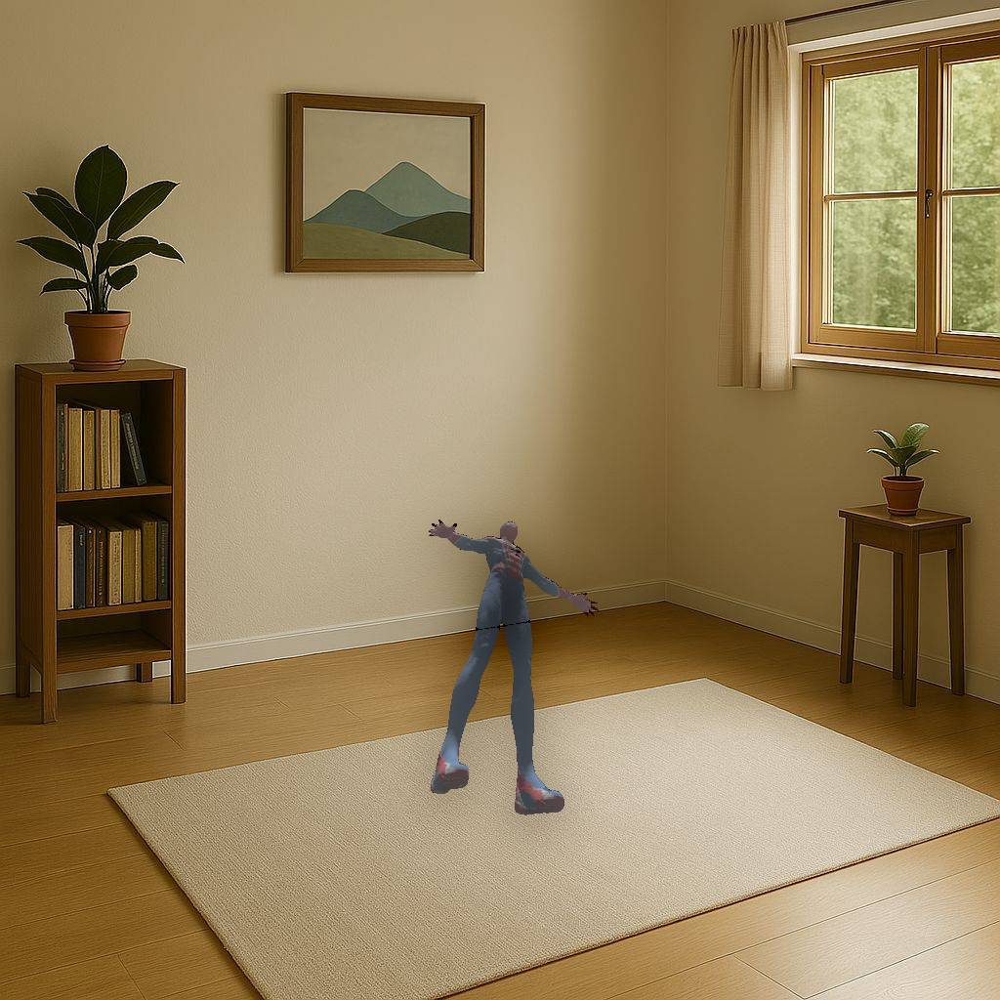

Final adapted image saved as 'output_retinex_result.png'


In [ ]:
if __name__ == "__main__":
    # --- Paths to your input images ---
    scene_path = "scene.jpg"
    scene_with_object_path = "scene_with_object.png"
    output_path = "output_retinex_result.png"

    # --- Load images ---
    scene = cv2.imread(scene_path)
    scene_with_object = cv2.imread(scene_with_object_path)

    if scene is None or scene_with_object is None:
        raise FileNotFoundError("Error: One or both input images could not be loaded.")

    # --- Apply Retinex-based lighting adaptation ---
    # output = apply_lighting_transfer(scene, scene_with_object)
    output = apply_lighting_and_shadow(scene, scene_with_object)
    print("Final Result\n")
    cv2_imshow(output)

    # --- Save result ---
    cv2.imwrite(output_path, output)
    print(f"Final adapted image saved as '{output_path}'")

##Shadow Rendering using a Soft-Projected 2D Blob + Gaussian Blur

In [ ]:
import cv2
import numpy as np


def estimate_shadow_direction(scene, visualize=True):
    gray = cv2.cvtColor(scene, cv2.COLOR_BGR2GRAY)

    # Step 1: Detect shadows as dark regions
    blurred = cv2.GaussianBlur(gray, (11, 11), 0)
    _, dark_regions = cv2.threshold(blurred, 80, 255, cv2.THRESH_BINARY_INV)

    # Optional: morphological cleaning
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    dark_regions = cv2.morphologyEx(dark_regions, cv2.MORPH_OPEN, kernel)

    # Step 2: Edge detection (find object boundaries)
    edges = cv2.Canny(gray, 50, 150)

    # Step 3: Compute distance transform from dark regions
    dist_transform = cv2.distanceTransform(dark_regions, cv2.DIST_L2, 5)

    # Step 4: Gradient of distance map
    grad_x = cv2.Sobel(dist_transform, cv2.CV_32F, 1, 0)
    grad_y = cv2.Sobel(dist_transform, cv2.CV_32F, 0, 1)

    # Step 5: Extract vectors at edge pixels
    edge_y, edge_x = np.where(edges > 0)
    if len(edge_x) < 50:
        print("Too few edge pixels detected.")
        return (15, 30)  # fallback shift

    dx = grad_x[edge_y, edge_x]
    dy = grad_y[edge_y, edge_x]

    magnitude = np.sqrt(dx ** 2 + dy ** 2) + 1e-6
    dx_norm = dx / magnitude
    dy_norm = dy / magnitude

    avg_dx = np.mean(dx_norm)
    avg_dy = np.mean(dy_norm)

    # Final direction vector, scaled
    direction = (int(avg_dx * 40), int(avg_dy * 40))

    if direction == (0, 0):
        print("Zero shadow direction. Falling back to default.")
        direction = (-50, -200)

    if visualize:
        import matplotlib.pyplot as plt
        vis = scene.copy()
        for x, y in zip(edge_x[::300], edge_y[::300]):
            end_x = int(x + avg_dx * 30)
            end_y = int(y + avg_dy * 30)
            cv2.arrowedLine(vis, (x, y), (end_x, end_y), (0, 0, 255), 2)
        cv2_imshow(vis)

    return direction

def extract_object_mask(scene_with_obj, scene, threshold=30):
    """
    Extracts the mask of the object by subtracting the scene from scene_with_obj.
    """
    diff = cv2.absdiff(scene_with_obj, scene)
    gray_diff = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(gray_diff, threshold, 255, cv2.THRESH_BINARY)

    # Refine mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    return mask



def project_soft_shadow(mask, shift=(15, 30), blur_ksize=51, shadow_intensity=0.4):
    """
    Project a soft shadow using 2D blob and Gaussian blur.

    Parameters:
    - mask: Binary mask of the object
    - shift: Tuple of (x_shift, y_shift) for shadow projection
    - blur_ksize: Kernel size for Gaussian blur (should be odd)
    - shadow_intensity: Darkness of shadow (0 to 1)
    """
    # Step 1: Shift mask to simulate light direction
    M = np.float32([[1, 0, shift[0]], [0, 1, shift[1]]])
    shifted_mask = cv2.warpAffine(mask, M, (mask.shape[1], mask.shape[0]))

    # Step 2: Squash vertically (simulate perspective)
    squashed_mask = cv2.resize(shifted_mask, (mask.shape[1], mask.shape[0] // 2))
    squashed_mask = cv2.copyMakeBorder(squashed_mask, mask.shape[0] // 2, 0, 0, 0, cv2.BORDER_CONSTANT, value=0)

    # Step 3: Blur the shadow mask
    shadow_blur = cv2.GaussianBlur(squashed_mask, (blur_ksize, blur_ksize), 0)

    # Step 4: Create 3-channel shadow layer
    shadow_layer = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    for i in range(3):
        shadow_layer[:, :, i] = (shadow_blur * shadow_intensity).astype(np.uint8)

    return shadow_layer


def apply_soft_shadow_blob(scene, scene_with_object):
    shadow_shift = estimate_shadow_direction(scene)
    mask = extract_object_mask(scene_with_object, scene)
    shadow = project_soft_shadow(mask, shift=shadow_shift, blur_ksize=65, shadow_intensity=0.45)
    # Step 3: Overlay shadow on scene_with_object using subtraction
    shadowed = cv2.subtract(scene_with_object, shadow)
    return shadowed


Zero shadow direction. Falling back to default.


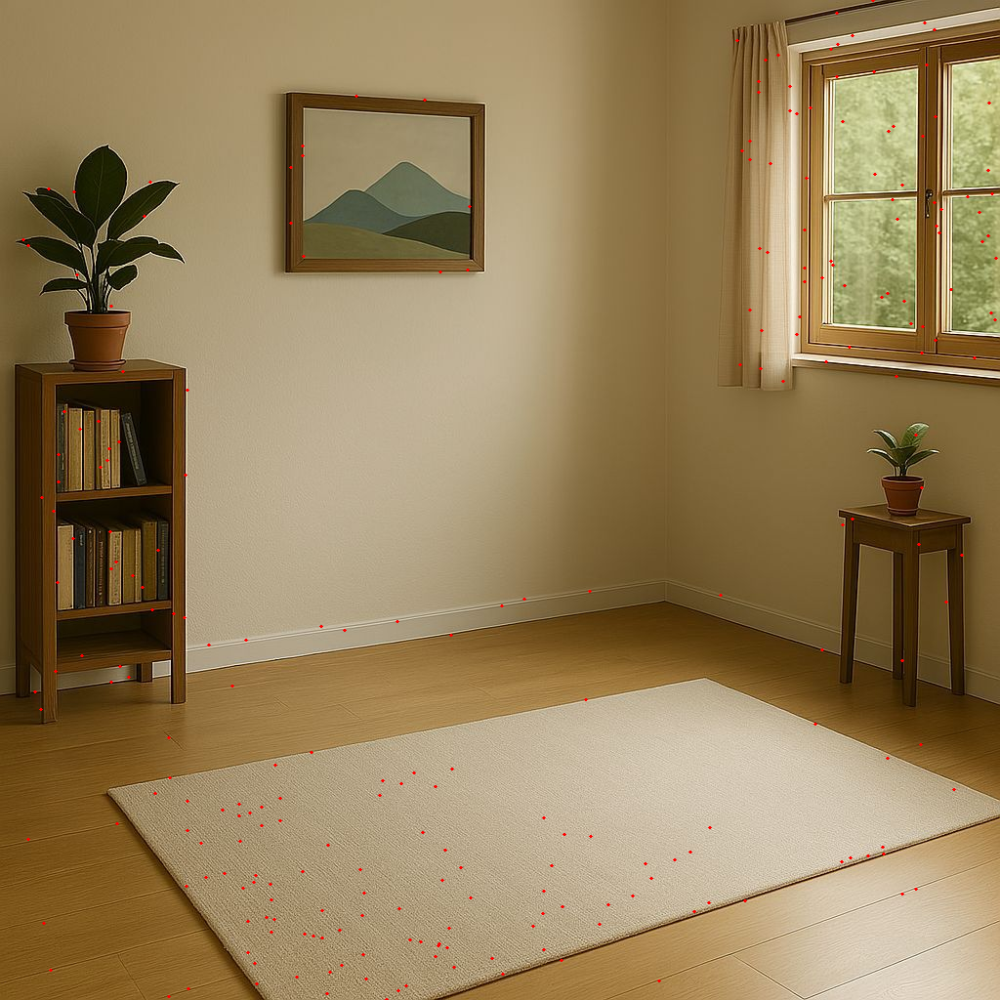

Original Image (Scene + Object):


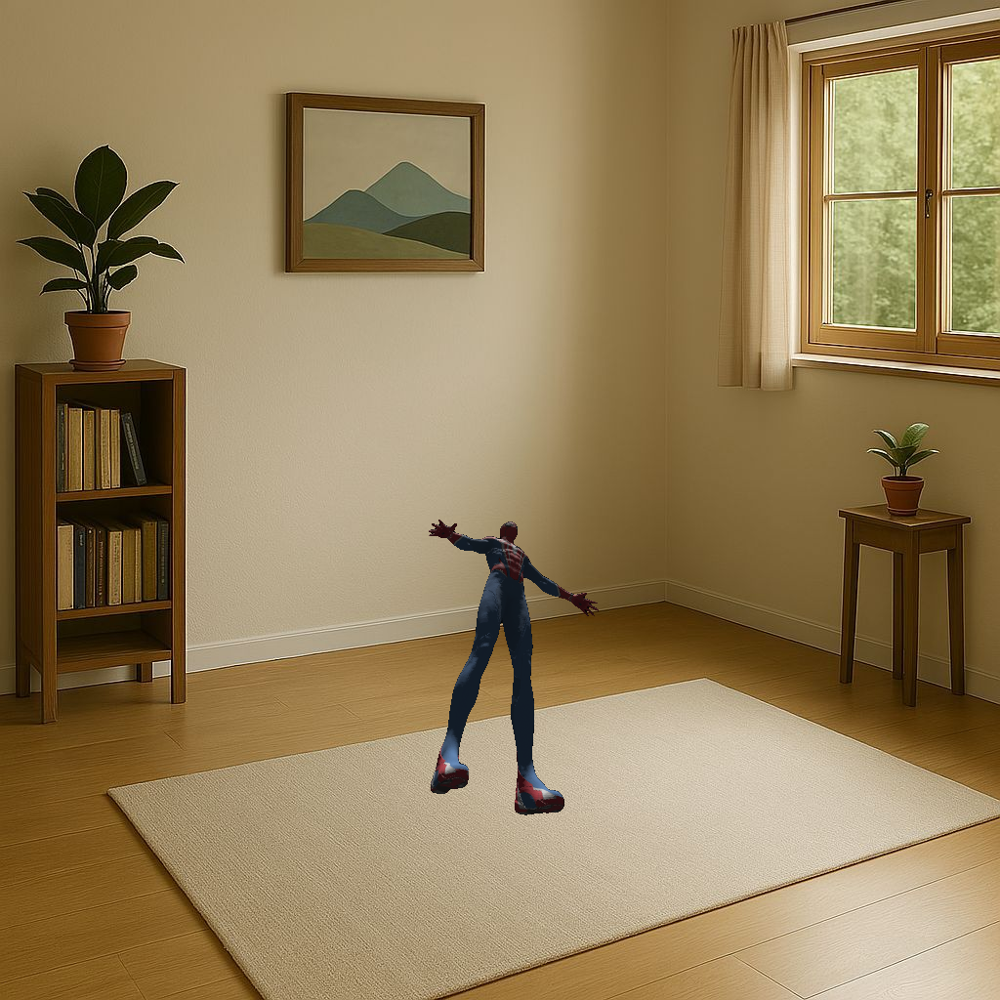

Output with Soft Projected Shadow:


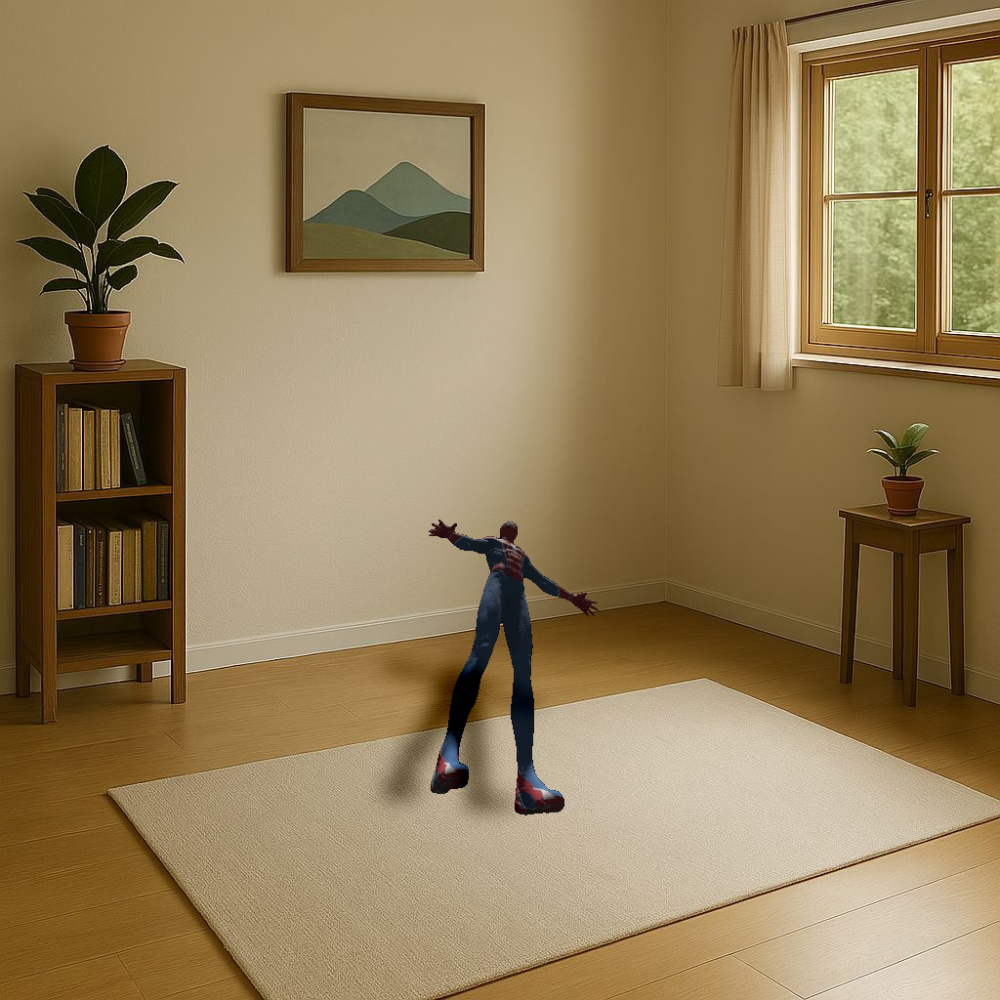

In [ ]:
if __name__ == "__main__":
  # Load input images
    scene = cv2.imread("scene.jpg")
    scene_with_object = cv2.imread("scene_with_object.png")

    # Generate output
    output = apply_soft_shadow_blob(scene, scene_with_object)

    # Save and show results
    cv2.imwrite("lit_object_scene.png", output)

    print("Original Image (Scene + Object):")
    cv2_imshow(scene_with_object)

    print("Output with Soft Projected Shadow:")
    cv2_imshow(output)

##ShadowGAN - Pre Trained Model , works only with 256*256 images

Object mask generated and saved as 'image_mask.png'
Original Image (Scene + Object):


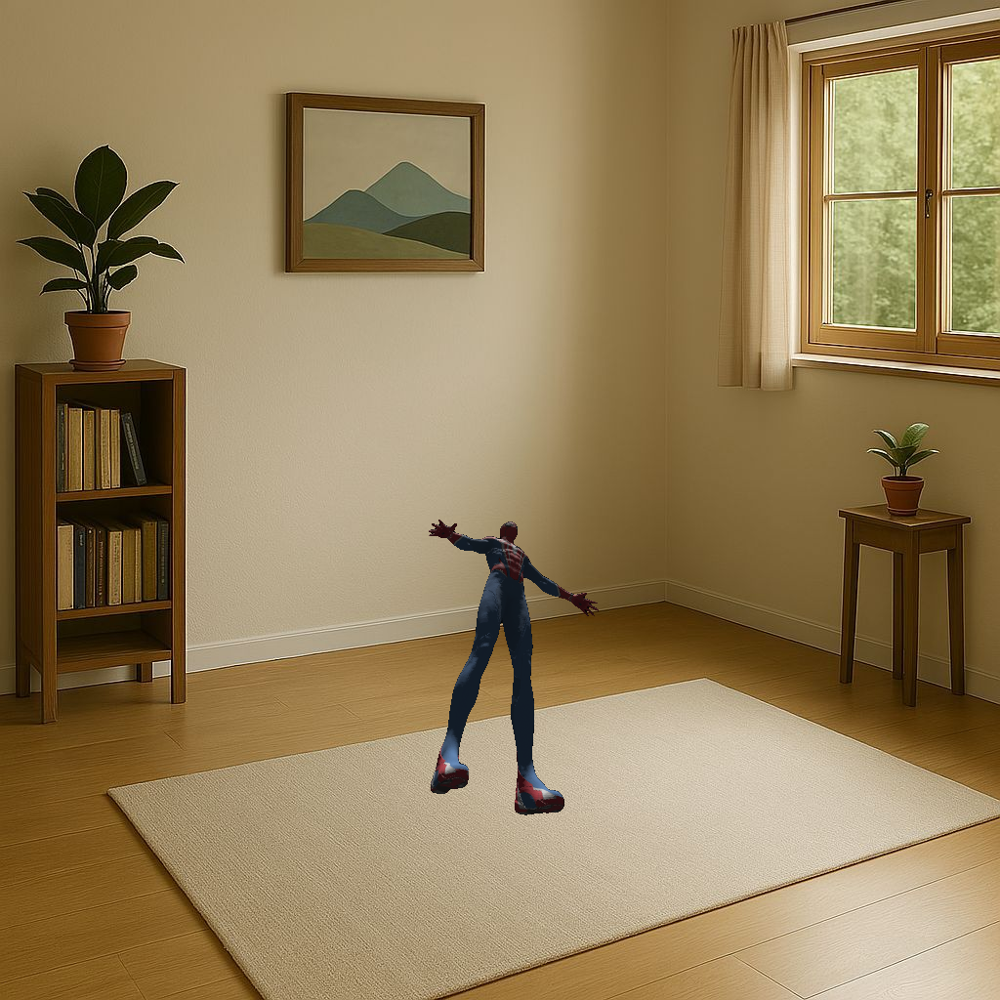

Object Mask:


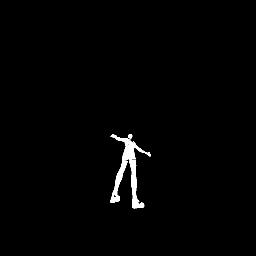

In [ ]:
import cv2
import numpy as np
import os


def generate_object_mask(scene: np.ndarray, scene_with_object: np.ndarray) -> np.ndarray:
    """Generate object mask by subtracting background from scene_with_object."""
    diff = cv2.absdiff(scene_with_object, scene)
    gray_diff = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)

    # Threshold to isolate the new object
    _, mask = cv2.threshold(gray_diff, 30, 255, cv2.THRESH_BINARY)

    # Clean small noise using morphological opening
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

    # Resize for model input
    mask = cv2.resize(mask, (256, 256))

    # Convert to 3D shape: (H, W, 1)
    mask = np.expand_dims(mask, axis=2)

    # Save for verification
    cv2.imwrite("image_mask.png", mask)
    print("Object mask generated and saved as 'image_mask.png'")

    return mask


if __name__ == "__main__":
    # Load input images
    scene = cv2.imread("scene.jpg")
    scene_with_object = cv2.imread("scene_with_object.png")

    if scene is None or scene_with_object is None:
        print("Error: Could not load input images.")
        exit(1)

    mask = generate_object_mask(scene, scene_with_object)
    print("Original Image (Scene + Object):")
    cv2_imshow(scene_with_object)
    print("Object Mask:")
    cv2_imshow(mask)


GAN Shadow Output:


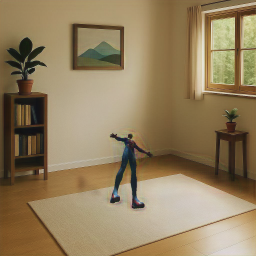

In [ ]:
import os
import os.path as osp
import cv2 as cv
import numpy as np
import tensorflow as tf
from google.colab.patches import cv2_imshow

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
node_names = {'input_image': 'placeholder/input_image:0',
              'input_mask': 'placeholder/input_mask:0',
              'output_attention': 'concat_1:0',
              'output_image': 'Tanh:0'}
data_root = 'data'
output_dir = 'output'


def read_image(image_path, channels):
    if channels == 3:
        image = cv.imread(image_path, cv.IMREAD_COLOR)
    else:
        image = cv.imread(image_path, cv.IMREAD_GRAYSCALE)
        image = np.expand_dims(image, axis=2)
    image = image.astype(np.float32) / 127.5 - 1.0  # Updated to np.float32
    return image


def test():
    if not osp.exists(data_root):
        print("No data directory")
        exit(0)

    model_pb = osp.join('model', 'model.pb')
    if not osp.exists(model_pb):
        print("No pre-trained model")
        exit(0)

    if not osp.exists(output_dir):
        os.makedirs(output_dir)

    # Updated for TensorFlow 2.x
    tf.compat.v1.disable_eager_execution()
    config = tf.compat.v1.ConfigProto()
    config.gpu_options.allow_growth = True
    with tf.compat.v1.Session(config=config) as sess:

        with tf.io.gfile.GFile(model_pb, 'rb') as f:
            graph_def = tf.compat.v1.GraphDef()
            graph_def.ParseFromString(f.read())
            sess.graph.as_default()
            tf.import_graph_def(graph_def, name='')

        sess.run(tf.compat.v1.global_variables_initializer())

        input_image = sess.graph.get_tensor_by_name(node_names['input_image'])
        input_mask = sess.graph.get_tensor_by_name(node_names['input_mask'])
        output_attention = sess.graph.get_tensor_by_name(node_names['output_attention'])
        output_image = sess.graph.get_tensor_by_name(node_names['output_image'])

        image_list = sorted(os.listdir(osp.join(data_root, 'noshadow')))
        image_batch = np.zeros((1, 256, 256, 3), dtype=np.float32)  # Updated to np.float32
        mask_batch = np.zeros((1, 256, 256, 1), dtype=np.float32)  # Updated to np.float32

        for i in image_list:

            image_batch[0] = read_image(osp.join(data_root, 'noshadow', i), 3)
            mask_batch[0] = 0 - read_image(osp.join(data_root, 'mask', i), 1)

            feed_dict = {input_image: image_batch,
                         input_mask: mask_batch}

            image, attention = sess.run([output_image, output_attention], feed_dict=feed_dict)
            image = ((1.0 + image) * 127.5).astype(np.uint8)
            object_attention = (attention[0, :, :, 0] * 255.0).astype(np.uint8)
            shadow_attention = (attention[0, :, :, 1] * 255.0).astype(np.uint8)

            cv.imwrite(os.path.join(output_dir, i), image[0])
            print("GAN Shadow Output:")
            cv2_imshow(image[0])
            cv.imwrite(os.path.join(output_dir, 'object_' + i), object_attention)
            cv.imwrite(os.path.join(output_dir, 'shadow_' + i), shadow_attention)


if __name__ == '__main__':
    test()

##Final Best Image

In [ ]:
import cv2
import numpy as np

def extract_object_and_mask(scene, scene_with_object, threshold=25):
    """
    Estimate object mask and object image using image subtraction.
    """
    # Compute absolute difference to localize the object
    diff = cv2.absdiff(scene, scene_with_object)
    gray_diff = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)

    # Threshold to create binary mask
    _, mask = cv2.threshold(gray_diff, threshold, 255, cv2.THRESH_BINARY)
    mask = cv2.medianBlur(mask, 5)  # Smooth noise

    # Convert single channel mask to 3 channels
    mask_3ch = cv2.merge([mask] * 3)

    # Extract the object by masking the scene_with_object
    object_rgb = cv2.bitwise_and(scene_with_object, mask_3ch)

    return object_rgb, mask

def gray_world_lighting_correction(scene, object_img, mask, blend_ratio=0.5):
    """
    Adjust object lighting using Gray-World Assumption and blend with original to avoid overcorrection.
    """
    scene_means = cv2.mean(scene)[:3]
    mask_float = mask / 255.0
    obj = object_img.astype(np.float32)

    object_means = [
        np.sum(obj[:, :, i] * mask_float) / (np.sum(mask_float) + 1e-6)
        for i in range(3)
    ]

    # Compute ratios and limit extreme values
    ratios = [min(max(scene_means[i] / (object_means[i] + 1e-6), 0.8), 1.2) for i in range(3)]

    # Apply ratios and blend with original
    adjusted_obj = obj.copy()
    for i in range(3):
        channel_corrected = np.clip(obj[:, :, i] * ratios[i], 0, 255)
        adjusted_obj[:, :, i] = blend_ratio * channel_corrected + (1 - blend_ratio) * obj[:, :, i]

    return adjusted_obj.astype(np.uint8)


def create_soft_shadow(mask, offset=(0, 0), intensity=50):
    """
    Create a soft shadow from a binary mask.
    """
    shadow = np.zeros_like(mask)
    M = np.float32([[1, 0, offset[0]], [0, 1, offset[1]]])
    shifted_mask = cv2.warpAffine(mask, M, (mask.shape[1], mask.shape[0]))
    blurred = cv2.GaussianBlur(shifted_mask, (31, 31), 0)

    # Create a 3-channel black shadow with soft alpha
    shadow_rgb = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    for i in range(3):
        shadow_rgb[:, :, i] = (blurred / 255.0 * intensity).astype(np.uint8)

    return blurred, shadow_rgb

def blend_object_and_shadow(scene, adjusted_object, mask, shadow_mask, shadow_rgb):
    """
    Composite the adjusted object and its shadow onto the scene.
    """
    output = scene.copy()

    # Blend shadow
    shadow_indices = shadow_mask > 0
    output[shadow_indices] = cv2.addWeighted(
        output[shadow_indices], 1.0,
        shadow_rgb[shadow_indices], 0.5, 0
    )

    # Soften object mask using Gaussian blur
    mask_soft = cv2.GaussianBlur(mask, (15, 15), 0)
    mask_float = mask_soft.astype(np.float32) / 255.0
    inv_mask = 1 - mask_float

    for c in range(3):
        output[:, :, c] = (adjusted_object[:, :, c] * mask_float +
                           output[:, :, c] * inv_mask).astype(np.uint8)

    return output

def add_contact_shadow(scene, mask, intensity=50):
    feet_shadow = cv2.erode(mask, np.ones((7, 7), np.uint8))
    blurred = cv2.GaussianBlur(feet_shadow, (21, 21), 5)
    contact_shadow = np.zeros_like(scene)
    for c in range(3):
        contact_shadow[:, :, c] = (blurred / 255.0 * intensity).astype(np.uint8)

    return cv2.addWeighted(scene, 1.0, contact_shadow, 0.5, 0)


def adjust_lighting(scene: np.ndarray, scene_with_object: np.ndarray) -> np.ndarray:
    object_rgb, mask = extract_object_and_mask(scene, scene_with_object)
    adjusted_object = gray_world_lighting_correction(scene, object_rgb, mask)
    shadow_mask, shadow_rgb = create_soft_shadow(mask)
    final = blend_object_and_shadow(scene, adjusted_object, mask, shadow_mask, shadow_rgb)
    final = add_contact_shadow(final, mask)
    return final

def estimate_shadow_direction(scene, visualize=True):
    gray = cv2.cvtColor(scene, cv2.COLOR_BGR2GRAY)

    # Step 1: Detect shadows as dark regions
    blurred = cv2.GaussianBlur(gray, (11, 11), 0)
    _, dark_regions = cv2.threshold(blurred, 80, 255, cv2.THRESH_BINARY_INV)

    # Optional: morphological cleaning
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    dark_regions = cv2.morphologyEx(dark_regions, cv2.MORPH_OPEN, kernel)

    # Step 2: Edge detection (find object boundaries)
    edges = cv2.Canny(gray, 50, 150)

    # Step 3: Compute distance transform from dark regions
    dist_transform = cv2.distanceTransform(dark_regions, cv2.DIST_L2, 5)

    # Step 4: Gradient of distance map
    grad_x = cv2.Sobel(dist_transform, cv2.CV_32F, 1, 0)
    grad_y = cv2.Sobel(dist_transform, cv2.CV_32F, 0, 1)

    # Step 5: Extract vectors at edge pixels
    edge_y, edge_x = np.where(edges > 0)
    if len(edge_x) < 50:
        print("Too few edge pixels detected.")
        return (15, 30)  # fallback shift

    dx = grad_x[edge_y, edge_x]
    dy = grad_y[edge_y, edge_x]

    magnitude = np.sqrt(dx ** 2 + dy ** 2) + 1e-6
    dx_norm = dx / magnitude
    dy_norm = dy / magnitude

    avg_dx = np.mean(dx_norm)
    avg_dy = np.mean(dy_norm)

    # Final direction vector, scaled
    direction = (int(avg_dx * 40), int(avg_dy * 40))

    if direction == (0, 0):
        print("Zero shadow direction. Falling back to default.")
        direction = (-50, -200)

    if visualize:
        import matplotlib.pyplot as plt
        vis = scene.copy()
        for x, y in zip(edge_x[::300], edge_y[::300]):
            end_x = int(x + avg_dx * 30)
            end_y = int(y + avg_dy * 30)
            cv2.arrowedLine(vis, (x, y), (end_x, end_y), (0, 0, 255), 2)
        cv2_imshow(vis)

    return direction

def extract_object_mask(scene_with_obj, scene, threshold=30):
    """
    Extracts the mask of the object by subtracting the scene from scene_with_obj.
    """
    diff = cv2.absdiff(scene_with_obj, scene)
    gray_diff = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(gray_diff, threshold, 255, cv2.THRESH_BINARY)

    # Refine mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    return mask



def project_soft_shadow(mask, shift=(15, 30), blur_ksize=51, shadow_intensity=0.4):
    """
    Project a soft shadow using 2D blob and Gaussian blur.

    Parameters:
    - mask: Binary mask of the object
    - shift: Tuple of (x_shift, y_shift) for shadow projection
    - blur_ksize: Kernel size for Gaussian blur (should be odd)
    - shadow_intensity: Darkness of shadow (0 to 1)
    """
    # Step 1: Shift mask to simulate light direction
    M = np.float32([[1, 0, shift[0]], [0, 1, shift[1]]])
    shifted_mask = cv2.warpAffine(mask, M, (mask.shape[1], mask.shape[0]))

    # Step 2: Squash vertically (simulate perspective)
    squashed_mask = cv2.resize(shifted_mask, (mask.shape[1], mask.shape[0] // 2))
    squashed_mask = cv2.copyMakeBorder(squashed_mask, mask.shape[0] // 2, 0, 0, 0, cv2.BORDER_CONSTANT, value=0)

    # Step 3: Blur the shadow mask
    shadow_blur = cv2.GaussianBlur(squashed_mask, (blur_ksize, blur_ksize), 0)

    # Step 4: Create 3-channel shadow layer
    shadow_layer = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    for i in range(3):
        shadow_layer[:, :, i] = (shadow_blur * shadow_intensity).astype(np.uint8)

    return shadow_layer


def apply_soft_shadow_blob(scene, scene_with_object):
    shadow_shift = estimate_shadow_direction(scene)
    mask = extract_object_mask(scene_with_object, scene)
    shadow = project_soft_shadow(mask, shift=shadow_shift, blur_ksize=65, shadow_intensity=0.45)
    # Step 3: Overlay shadow on scene_with_object using subtraction
    shadowed = cv2.subtract(scene_with_object, shadow)
    return shadowed

Scene with Object Image



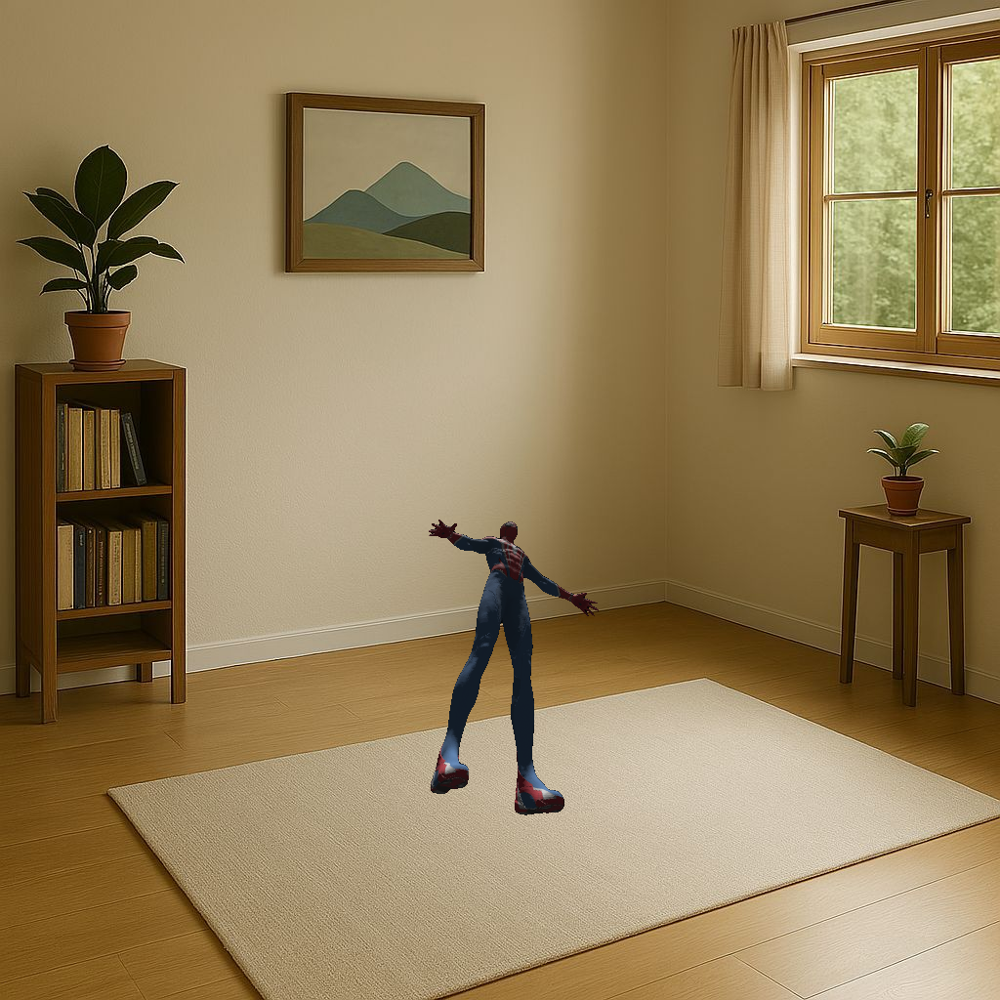

Zero shadow direction. Falling back to default.


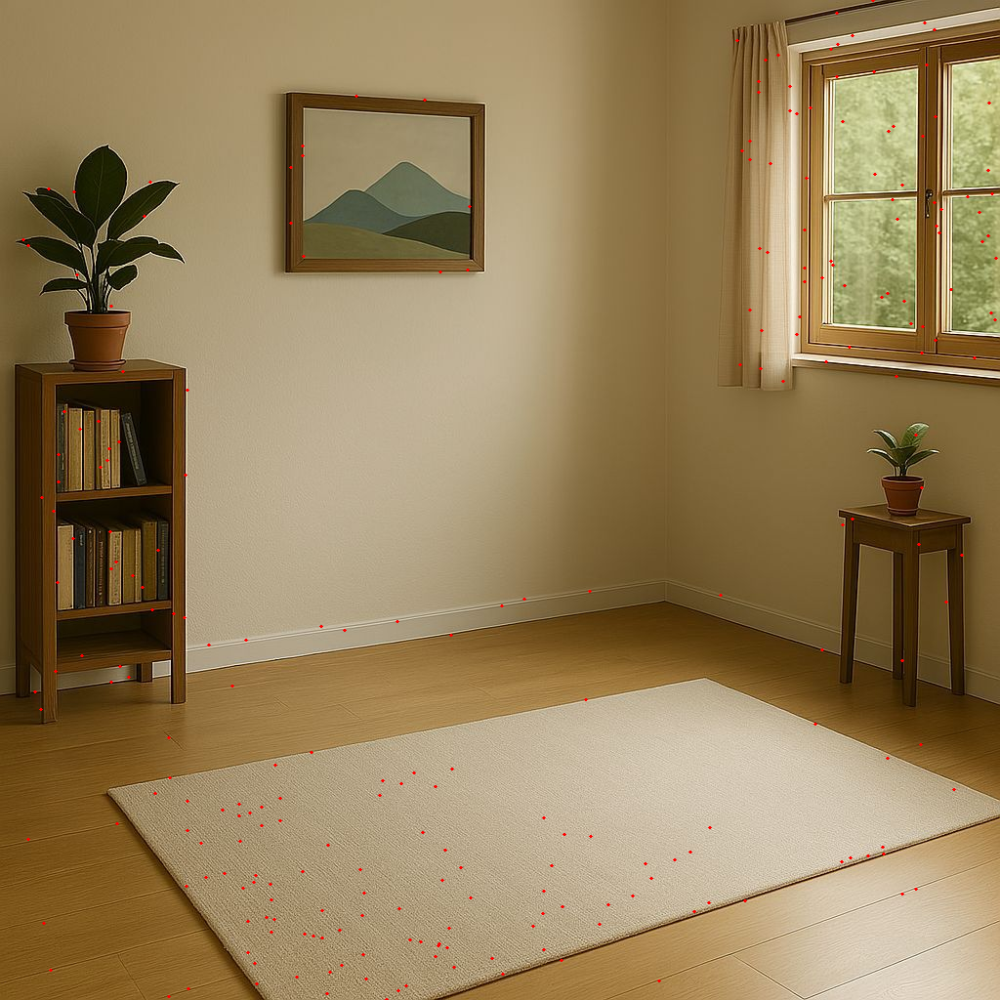

Final Result



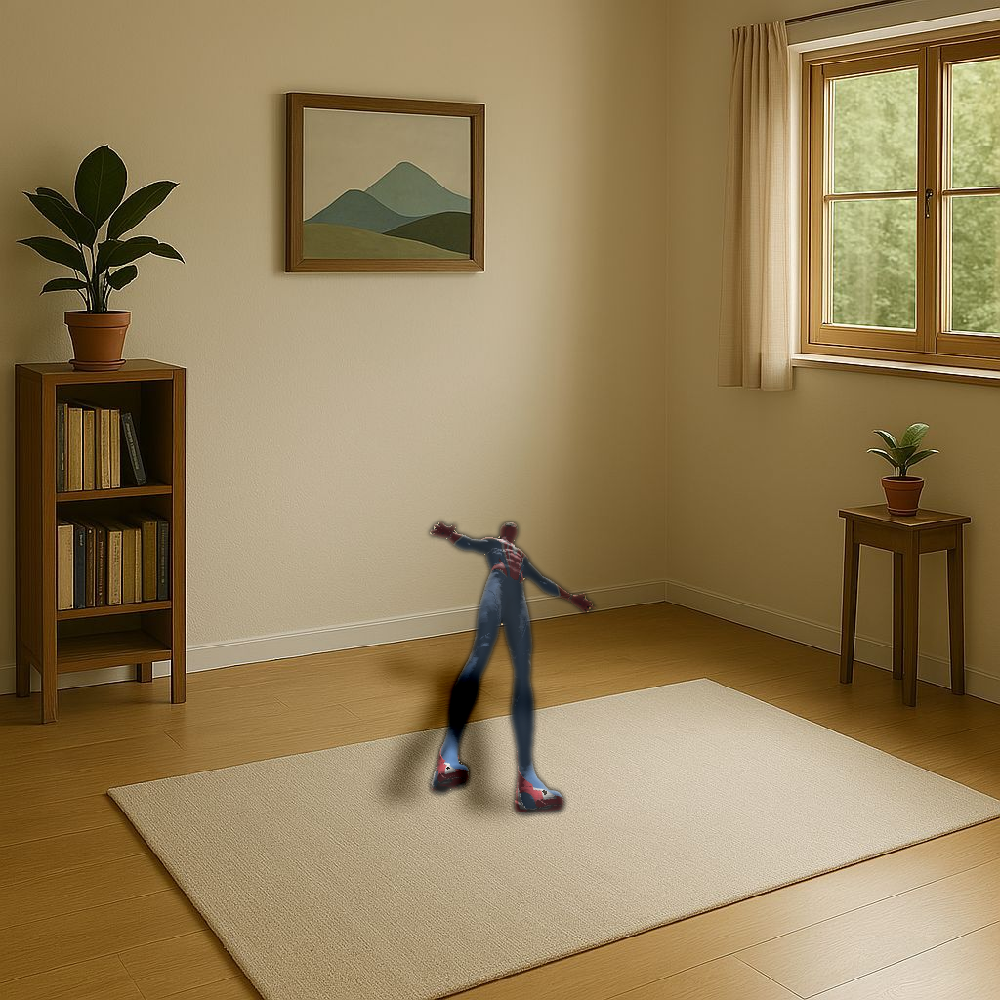

In [ ]:
if __name__ == "__main__":
    # Load images
    scene = cv2.imread("/content/scene.jpg")
    object_img = cv2.imread("/content/scene_with_object.png", cv2.IMREAD_UNCHANGED)  # With alpha
    print("Scene with Object Image\n")
    cv2_imshow(object_img)

    if object_img is None or scene is None:
        raise FileNotFoundError("Check image paths. One or both images not found.")


    result = adjust_lighting(scene, object_img)
    output = apply_soft_shadow_blob(scene, result)
    print("Final Result\n")
    cv2_imshow(output)

#  Streamlit UI │ ←——— Upload, click, export